In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os
import sys
import tempfile
import pyabc

import healpy as hp
from astropy.coordinates import SkyCoord, Angle
import astropy.units as u
import pandas as pd

sys.path.insert(0, '/home/aew492/lss-dipoles/code')
import tools
import dipole
import generate_mocks as gm
import multipoles
from abc_for_qso import get_catalog_info

### helper functions 

In [3]:
def get_abc_results_dipole_only(fn, xticks=None, title=None):

    res = np.load(fn, allow_pickle=True).item()
    history = res['history']
    prior = res['prior']
    posterior = res['posterior']
    selfunc = res['selfunc']
    expected_dipamp = res['expected_dipole_amp']
    print(f"expected dipole_amp = {expected_dipamp}")
    
    # quantiles
    df, w = posterior
    q_dipamp = tools.quantile(df['dipole_amp'], [0.16, 0.5, 0.84], weights=w)

    # calculate the sigma discrepancy: ****check with Kate and Hogg: is this the right way to do this?
    # z score is z = (x_0 - \mu) / \sigma , where x_0 is the null hypothesis, \mu is mean (or MAP? or median?)
    #    and \sigma = std. of the posterior
    
    # how different is the mean from the median?
    print(f"mean dipole_amp = {pyabc.weighted_statistics.weighted_mean(df['dipole_amp'], w):.4f}")
    print(f"median dipole_amp = {q_dipamp[1]:.4f}")
    mu = q_dipamp[1]
    
    # standard deviation
    sigma = pyabc.weighted_statistics.weighted_std(df['dipole_amp'], w)
    print(f"std dipole_amp = {sigma:.4f}")

    relamp = np.array(q_dipamp) / expected_dipamp
    
    # z score
    z = (expected_dipamp - mu) / sigma
    print(f"z score = {z:.4f}")

    # plot (copied and adjusted from the pyabc.visualization source code)
    par_id = [x for x in prior.keys()][0]
    fig, ax = plt.subplots(figsize=(5,4), tight_layout=True)
    label = 'Dipole amplitude in CMB dir.'
    
    df, w = posterior
    
    # quantiles?
    q = tools.quantile(df[par_id], [0.16, 0.5, 0.84], weights=w)
    
    # diagonal
    ax.axvline(q[1], c='k', alpha=0.4, ls='-', label='Median')
    ax.axvspan(q[0], q[2], color='k', alpha=0.05)
    ax.axhline(0., c='k', alpha=0.5, lw=0.5)
    ax.axvline(expected_dipamp, c='crimson', alpha=0.8, lw=1.5, label='Expected')
    ax.legend()
    ax.grid(alpha=0.5, lw=0.5)
    ax.set_xlim(prior[par_id].args[0], prior[par_id].args[0] + prior[par_id].args[1])
    if xticks is not None:
        ax.set_xticks(xticks)
    ax.axvline(0., c='k', alpha=0.5, lw=0.5)
    
    x, pdf = tools.get_kde_1d([df, w], prior, par_id)
    ax.plot(x, pdf, c='k', alpha=0.9, lw=1.5)
    
    ax.set_ylabel(label)
    ax.set_xlabel(label)

    if title is not None:
        ax.set_title(title)

    return q_dipamp, relamp, z, res, ax

In [4]:
def get_abc_results_free_dipole(fn, xticks=None, title=None):

    res = np.load(fn, allow_pickle=True).item()
    history = res['history']
    prior = res['prior']
    posterior = res['posterior']
    selfunc = res['selfunc']
    expected_dipamp = res['expected_dipole_amp']

    par_ids = [x for x in prior.keys()]
    fig, axs = plt.subplots(len(par_ids), len(par_ids), figsize=(10,8), tight_layout=True)
    labels = [r'$|\vec{\mathcal{D}}_x|$', r'$|\vec{\mathcal{D}}_y|$', r'$|\vec{\mathcal{D}}_z|$']  # bug: these labels are hard-coded

    df, w = posterior

    # quantiles
    qs = [
        tools.quantile(df[par_id], [0.16, 0.5, 0.84], weights=w) for par_id in ['dipole_x', 'dipole_y', 'dipole_z']
    ]

    for i, par_id in enumerate(par_ids):

        # quantile
        q = qs[i]
        
        # diagonal
        ax = axs[i, i]
        ax.axvline(q[1], c='k', alpha=0.6, ls='-', label='Median')
        ax.axvspan(q[0], q[2], color='k', alpha=0.05)
        ax.axhline(0., c='k', alpha=0.5, lw=0.5)
        ax.grid(alpha=0.5, lw=0.5)
        ax.set_xlim(prior[par_id].args[0], prior[par_id].args[0] + prior[par_id].args[1])
        if xticks is not None:
            ax.set_xticks(xticks)
        ax.axvline(0., c='k', alpha=0.5, lw=0.5)
        
        x, pdf = tools.get_kde_1d([df, w], prior, par_id)
        ax.plot(x, pdf, c='k', alpha=0.9, lw=1.5)

        axs[i,0].set_ylabel(labels[i], fontsize=12)
        axs[len(par_ids)-1,i].set_xlabel(labels[i], fontsize=12)

        for j in range(0, i):
    
            # lower
            ax = axs[i, j]
            x, y, pdf = tools.get_kde_2d([df, w], prior, par_ids[j], par_id)
            mesh = ax.pcolormesh(x, y, pdf, shading='auto', cmap='binary')
    
            # upper
            ax = axs[j, i]
            tools.scatter([df, w], prior, par_id, par_ids[j], ax, color='k', alpha=0.5, marker='.', s=3)
            ax.grid(alpha=0.5, lw=0.5)
        
    if title is not None:
        fig.suptitle(title)

    return qs, res, axs

In [5]:
def get_abc_results_dipole_excess(fn, xticks=None, title=None, plot=True):

    res = np.load(fn, allow_pickle=True).item()
    history = res['history']
    prior = res['prior']
    posterior = res['posterior']
    selfunc = res['selfunc']
    expected_dipamp = res['expected_dipole_amp']
    print(f"expected dipole_amp = {expected_dipamp}")
    
    # quantiles
    df, w = posterior
    q_dipamp = tools.quantile(df['dipole_amp'], [0.16, 0.5, 0.84], weights=w)
    q_excess = tools.quantile(df['log_excess'], [0.16, 0.5, 0.84], weights=w)

    # calculate the sigma discrepancy: ****check with Kate and Hogg: is this the right way to do this?
    # z score is z = (x_0 - \mu) / \sigma , where x_0 is the null hypothesis, \mu is mean (or MAP? or median?)
    #    and \sigma = std. of the posterior
    
    # how different is the mean from the median?
    print(f"mean dipole_amp = {pyabc.weighted_statistics.weighted_mean(df['dipole_amp'], w):.4f}")
    print(f"median dipole_amp = {q_dipamp[1]:.4f}")
    mu = q_dipamp[1]
    
    # standard deviation
    sigma = pyabc.weighted_statistics.weighted_std(df['dipole_amp'], w)
    print(f"std dipole_amp = {sigma:.4f}")

    relamp = np.array(q_dipamp) / expected_dipamp
    
    # z score
    z = (expected_dipamp - mu) / sigma
    print(f"z score = {z:.4f}")

    if plot:
        # plot (copied and adjusted from the pyabc.visualization source code)
        fig, axs = plt.subplots(2, 2, figsize=(7,6), tight_layout=True)
        
        df, w = posterior
    
        par_ids = [x for x in prior.keys()]
        labels = [r'$|\vec{\mathcal{D}}_{\mathrm{proj},k}|$', r'$\log \bar C$']  # bug: these labels are hard-coded
    
        for i, par_id in enumerate(par_ids):
        
            # quantiles?
            q = tools.quantile(df[par_id], [0.16, 0.5, 0.84], weights=w)
            
            # diagonal
            ax = axs[i, i]
            ax.axvline(q[1], c='k', alpha=0.4, ls='-', label='Median')
            ax.axvspan(q[0], q[2], color='k', alpha=0.05)
            ax.axhline(0., c='k', alpha=0.5, lw=0.5)
            if i == 0:
                ax.axvline(expected_dipamp, c='crimson', alpha=0.8, lw=1.5, label='Expected')
                ax.legend()
            ax.grid(alpha=0.5, lw=0.5)
            ax.set_xlim(prior[par_id].args[0], prior[par_id].args[0] + prior[par_id].args[1])
            if xticks is not None:
                ax.set_xticks(xticks)
            ax.axvline(0., c='k', alpha=0.5, lw=0.5)
            
            x, pdf = tools.get_kde_1d([df, w], prior, par_id)
            ax.plot(x, pdf, c='k', alpha=0.9, lw=1.5)
    
            axs[i,0].set_ylabel(labels[i], fontsize=12)
            axs[len(par_ids)-1,i].set_xlabel(labels[i], fontsize=12)
    
            for j in range(0, i):
        
                # lower
                ax = axs[i, j]
                x, y, pdf = tools.get_kde_2d([df, w], prior, par_ids[j], par_id)
                mesh = ax.pcolormesh(x, y, pdf, shading='auto', cmap='binary')
        
                # upper
                ax = axs[j, i]
                tools.scatter([df, w], prior, par_id, par_ids[j], ax, color='k', alpha=0.5, marker='.', s=3)
                ax.grid(alpha=0.5, lw=0.5)
        
        if title is not None:
            fig.suptitle(title)
    
        return q_dipamp, q_excess, relamp, z, res, axs
        
    else:
        return q_dipamp, q_excess, relamp, z, res

In [70]:
def get_fake_data(case_dir):
    
    # load fake data info: get the data map and convert to overdensity
    fake_data = np.load(os.path.join(case_dir, 'fake_data.npy'), allow_pickle=True).item()
    qmap = fake_data['data']['data'].astype(float)
    Nunmasked = np.sum(qmap != 0.)
    qmap[qmap == 0.] = np.nan
    
    # selfunc-corrected
    qmap_corr = qmap / fake_data['selfunc']
    
    # overdensity
    odmap = qmap / np.nanmean(qmap) - 1
    odmap_corr = qmap_corr / np.nanmean(qmap_corr) - 1
    
    # back out the dipole 3-vector from the input amplitude and CMB dipole direction
    input_kin_dipole_comps = dipole.cmb_dipole(amplitude=fake_data['input_dipole_amp'], return_comps=True)
    
    # construct the kinematic dipole and excess power maps
    input_kin_dipmap = dipole.dipole_map(np.append(0, input_kin_dipole_comps))
    try:
        excess_map = hp.sphtfunc.alm2map(fake_data['alms'], 64)
    except TypeError:  # this happens if there is zero excess power, then the alms are zero
        assert np.all(fake_data['alms'] == 0.)
        excess_map = np.zeros_like(input_kin_dipmap)
    total_map = input_kin_dipmap + excess_map
    
    # dipole in the map: fit the dipole using healpy's least-squares fit function
    #  we trust this to give us the true dipole since we're working on the full sky
    fit_dipole_comps = hp.fit_dipole(total_map)[1]
    print(f"best-fit dipole (no SN):\t{fit_dipole_comps}\tamplitude = {np.linalg.norm(fit_dipole_comps):.4f}")
    
    # projection of the total dipole onto the CMB dipole direction
    proj = (np.dot(input_kin_dipole_comps, fit_dipole_comps)/np.linalg.norm(input_kin_dipole_comps)**2)*input_kin_dipole_comps
    true_dipamp_proj = np.linalg.norm(proj)
    print(f"amplitude of the total dipole projected onto the expected dipole direction:\t{true_dipamp_proj:.5f}")

    return dict(odmap=odmap, odmap_corr=odmap_corr,
                input_kin_dipmap=input_kin_dipmap, excess_map=excess_map, total_map=total_map,
                true_dipamp_proj=true_dipamp_proj, Nunmasked=Nunmasked, fit_dipole_comps=fit_dipole_comps, selfunc=fake_data['selfunc'],
               fake_data_dict=fake_data)

In [7]:
def plot_posterior_evolution(param, res=None, history=None, true_dipamp_proj=None, input_log_excess=None, shotnoise=None):
    assert param.lower() in ['dipole_amp', 'log_excess'], "param must be 'dipole_amp' or 'log_excess'"
    history = history if history is not None else res['history']
    fig, ax = plt.subplots(figsize=(7,4), tight_layout=True)
    norm = mpl.colors.Normalize(vmin=0, vmax=history.max_t)
    smap = mpl.cm.ScalarMappable(norm=norm, cmap='turbo_r')
    for i in range(history.max_t + 1):
        pyabc.visualization.plot_kde_1d_highlevel(history, param, t=i, ax=ax, color=smap.to_rgba(i), alpha=0.9)
    ax.grid(alpha=0.5, lw=0.5)
    ax.set_xlabel(param)
    ax.axhline(0., c='k', alpha=0.5, lw=0.5)
    fig.colorbar(smap, ax=ax, label='Generation')
    if res is not None:
        ax.set_xlim(res['prior'][param].args[0], res['prior'][param].args[0] + res['prior'][param].args[1])
    if param == 'log_excess':
        if input_log_excess is not None:
            ax.axvline(float(log_excess), c='royalblue', alpha=0.8, label='Input')
        if shotnoise is not None:
            ax.axvline(np.log10(shotnoise), c='mediumseagreen', alpha=0.8, ls='-', label='Shot noise')
    else:
        if true_dipamp_proj is not None:
            ax.axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
    ax.legend()

In [8]:
# parameters to load results
nside = 2
base_rate_quaia = get_catalog_info('quaia_G20.0')['base_rate']
resdir = '/scratch/aew492/lss-dipoles_results/results'
Nsources_quaia = 509753

## fake Quaia G20.0 zodi, 1x dipole, zero excess power

In [24]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = 'zero'
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess})'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate_quaia:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}')

In [25]:
# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole (no SN):	[-0.00504284  0.00109153 -0.00064682]	amplitude = 0.0052
amplitude of the total dipole projected onto the expected dipole direction:	0.00520


In [19]:
# smooth the map
smoothed_odmap_corr = tools.smooth_map(odmap_corr)

Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = zero)')

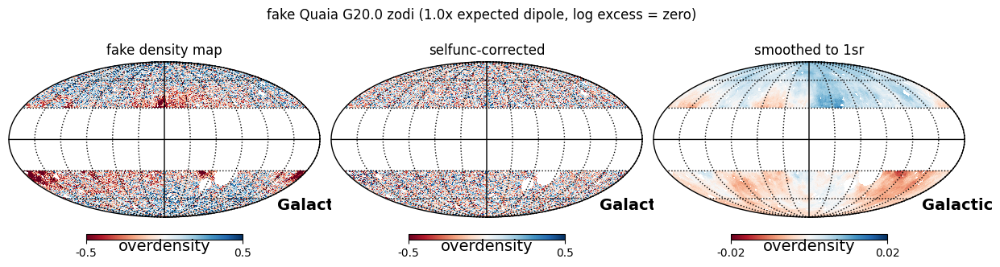

In [26]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.5, max=.5, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.5, max=.5, **kwargs)
hp.mollview(smoothed_odmap_corr, title='smoothed to 1sr', sub=(1,3,3), min=-.02, max=.02, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8)

#### dipole only model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0062
median dipole_amp = 0.0059
std dipole_amp = 0.0029
z score = -0.2401


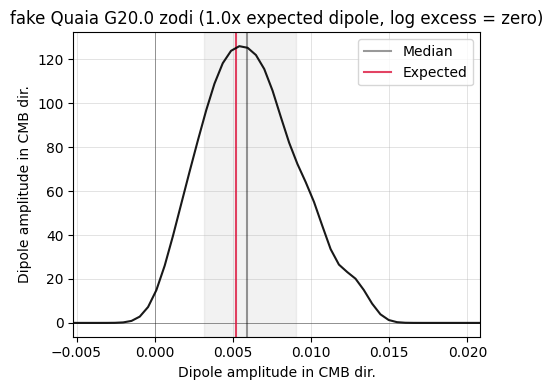

In [27]:
nmocks = 500
q, relamp, z, res, ax = get_abc_results_dipole_only(os.path.join(case_dir,
                                    f'dipole_only_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label)

In [28]:
# mean of accepted mocks
mean_accepted_mock = np.zeros_like(odmap)
for i in range(nmocks):
    print(f"mock {i}", end='\r')
    mean_accepted_mock += np.load(os.path.join(case_dir, f'dipole_only_nside{nside}_{nmocks}mocks_10iters', 'accepted_samples', f'mock{i}.npy'))
mean_accepted_mock /= nmocks

In [29]:
# selfunc corr, convert to overdensity and smooth map
mean_accepted_mock[mean_accepted_mock == 0.] = np.nan
mean_accepted_mock_corr = mean_accepted_mock / fake_data['selfunc']

mock_odmap = mean_accepted_mock / np.nanmean(mean_accepted_mock) - 1
mock_odmap_corr = mean_accepted_mock_corr / np.nanmean(mean_accepted_mock_corr) - 1

# smooth the selfunc-corrected mean accepted mock (the un-selfunc-corrected is already pretty smooth from the averaging)
smoothed_mock_odmap_corr = tools.smooth_map(mock_odmap_corr)

Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = zero)')

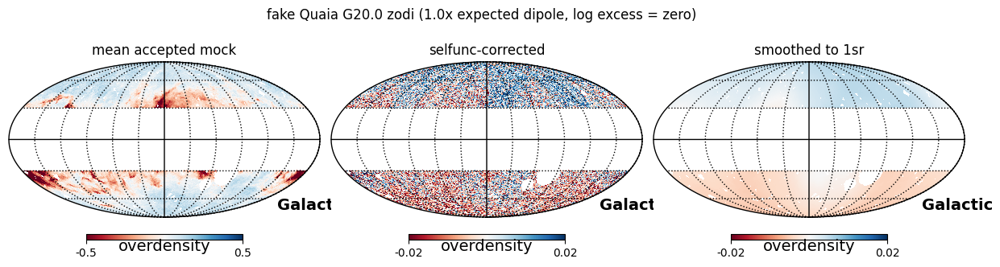

In [30]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(mock_odmap, title='mean accepted mock', sub=(1,3,1), min=-.5, max=.5, **kwargs)
hp.mollview(mock_odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.02, max=.02, **kwargs)
hp.mollview(smoothed_mock_odmap_corr, title='smoothed to 1sr', sub=(1,3,3), min=-.02, max=.02, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8)

In [31]:
# residual with the data
resid = smoothed_mock_odmap_corr - smoothed_odmap_corr

Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = zero)')

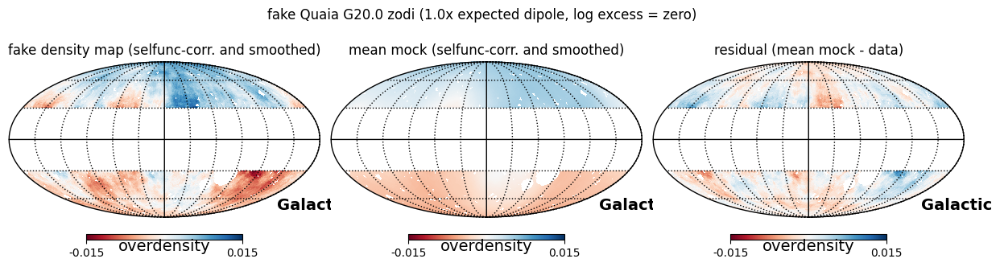

In [32]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.015, max=.015)
hp.mollview(smoothed_odmap_corr, title='fake density map (selfunc-corr. and smoothed)', sub=(1,3,1), **kwargs)
hp.mollview(smoothed_mock_odmap_corr, title='mean mock (selfunc-corr. and smoothed)', sub=(1,3,2), **kwargs)
hp.mollview(resid, title='residual (mean mock - data)', sub=(1,3,3), **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8)

#### dipole and excess model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0053
median dipole_amp = 0.0053
std dipole_amp = 0.0030
z score = -0.0345


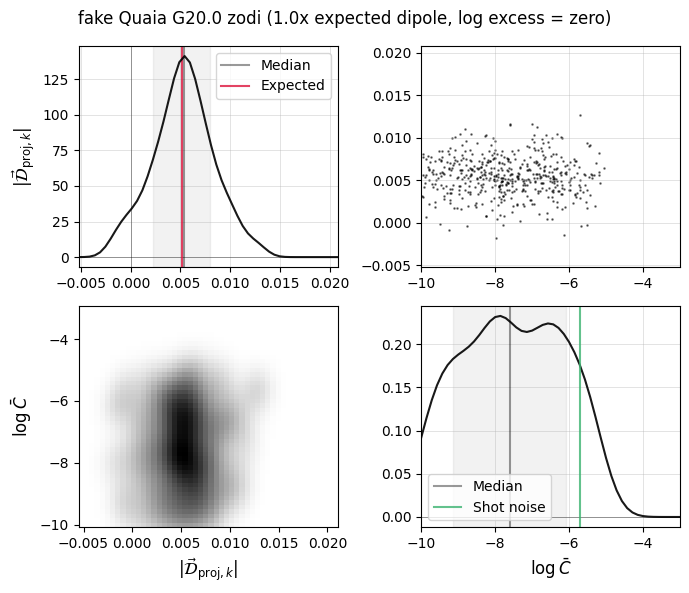

In [33]:
nmocks = 500
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label)
axs[1,1].axvline(np.log10(1 / Nsources_quaia), c='mediumseagreen', alpha=0.8, label='Shot noise')
axs[1,1].legend()

In [34]:
# load the accepted mocks and compute the mean
mean_accepted_mock = np.zeros_like(odmap)
for i in range(nmocks):
    print(f"mock {i}", end='\r')
    mean_accepted_mock += np.load(os.path.join(case_dir, f'dipole_excess_nside{nside}_{nmocks}mocks_10iters', 'accepted_samples', f'mock{i}.npy'))
mean_accepted_mock /= nmocks

# selfunc corr, convert to overdensity and smooth map
mean_accepted_mock[mean_accepted_mock == 0.] = np.nan
mean_accepted_mock_corr = mean_accepted_mock / fake_data['selfunc']

mock_odmap = mean_accepted_mock / np.nanmean(mean_accepted_mock) - 1
mock_odmap_corr = mean_accepted_mock_corr / np.nanmean(mean_accepted_mock_corr) - 1

# smooth the selfunc-corrected mean accepted mock (the un-selfunc-corrected is already pretty smooth from the averaging)
smoothed_mock_odmap_corr = tools.smooth_map(mock_odmap_corr)

# residual with the data
resid = smoothed_mock_odmap_corr - smoothed_odmap_corr

KeyboardInterrupt: 

Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = zero): dipole excess model')

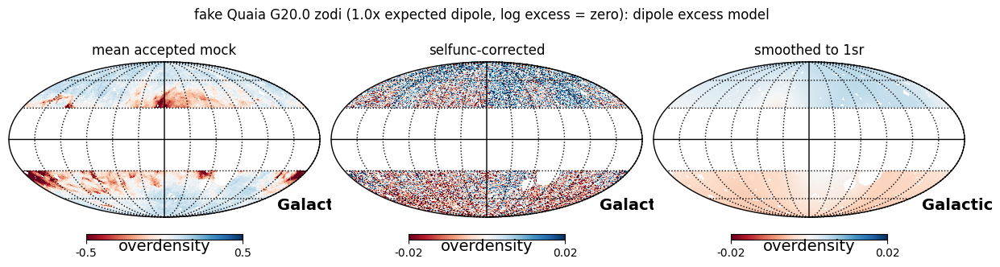

In [92]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(mock_odmap, title='mean accepted mock', sub=(1,3,1), min=-.5, max=.5, **kwargs)
hp.mollview(mock_odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.02, max=.02, **kwargs)
hp.mollview(smoothed_mock_odmap_corr, title='smoothed to 1sr', sub=(1,3,3), min=-.02, max=.02, **kwargs)
hp.graticule()
fig.suptitle(label + ': dipole excess model', y=0.8)

Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = zero): dipole excess model')

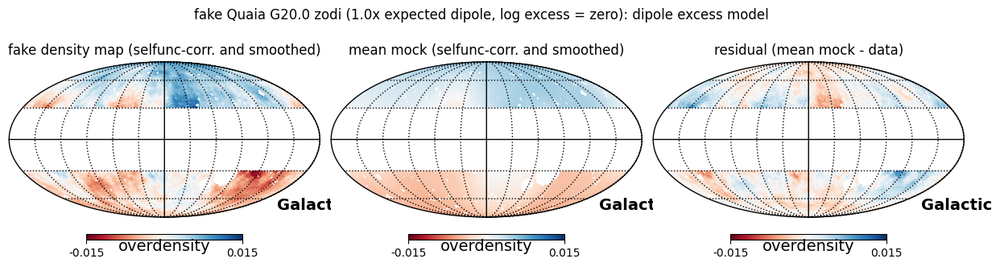

In [93]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.015, max=.015)
hp.mollview(smoothed_odmap_corr, title='fake density map (selfunc-corr. and smoothed)', sub=(1,3,1), **kwargs)
hp.mollview(smoothed_mock_odmap_corr, title='mean mock (selfunc-corr. and smoothed)', sub=(1,3,2), **kwargs)
hp.mollview(resid, title='residual (mean mock - data)', sub=(1,3,3), **kwargs)
hp.graticule()
fig.suptitle(label + ': dipole excess model', y=0.8)

#### free dipole model

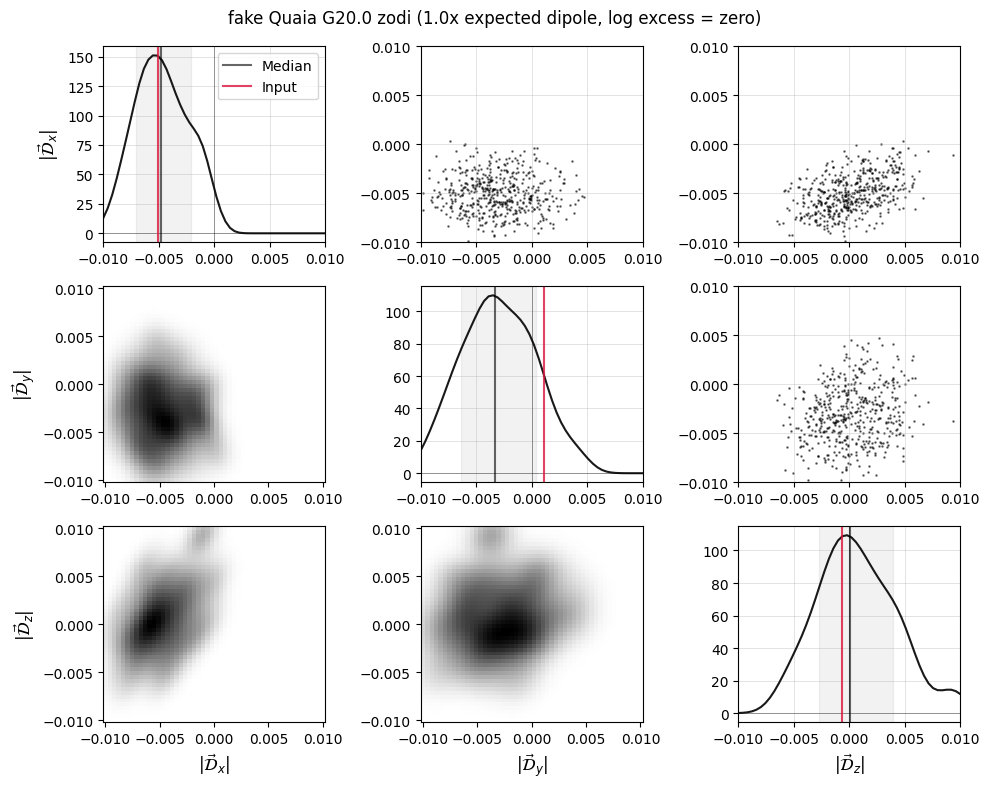

In [54]:
nmocks = 500
qs, res, axs = get_abc_results_free_dipole(os.path.join(case_dir,
                                    f'free_dipole_nside{nside}_{nmocks}mocks_14iters', 'results.npy'), title=label)
for i, comp in enumerate(fake_data['fit_dipole_comps']):
    axs[i,i].axvline(comp, c='crimson', alpha=0.8, label='Input')
axs[0,0].legend()

In [39]:
# posterior dipole is the 3-vector with the median of each component posterior
posterior_dipole_comps = np.array([q[1] for q in qs])
print(f"posterior dipole = {posterior_dipole_comps}; amplitude = {np.linalg.norm(posterior_dipole_comps):.5f}")

posterior dipole = [-4.77754934e-03 -3.26281691e-03  4.92516182e-05]; amplitude = 0.00579


In [48]:
# and what does the healpy least-squares fit say? we expect this to suffer from mode-coupling due to the cut sky
total_dipole_comps = hp.fit_dipole(odmap_corr)[1]
print(f"total dipole = {total_dipole_comps}; amplitude = {np.linalg.norm(total_dipole_comps):.5f}")

total dipole = [-0.00448734 -0.002305   -0.00022152]; amplitude = 0.00505


In [41]:
# mean of accepted mocks
mean_accepted_mock = np.zeros_like(odmap)
for i in range(nmocks):
    print(f"mock {i}", end='\r')
    mean_accepted_mock += np.load(os.path.join(case_dir, f'free_dipole_nside{nside}_{nmocks}mocks_14iters', 'accepted_samples', f'mock{i}.npy'))
mean_accepted_mock /= nmocks
mean_accepted_mock_corr = mean_accepted_mock / fake_data['selfunc']
mean_accepted_mock_corr[mean_accepted_mock_corr == 0.] = np.nan
mean_odmap_mock_corr = mean_accepted_mock_corr / np.nanmean(mean_accepted_mock_corr) - 1 

/state/partition1/job-62747403/ipykernel_3268747/659504017.py:7: RuntimeWarning: invalid value encountered in divide
  mean_accepted_mock_corr = mean_accepted_mock / fake_data['selfunc']


In [42]:
# smooth the mock map
smoothed_mean_odmap_mock_corr = tools.smooth_map(mean_odmap_mock_corr)

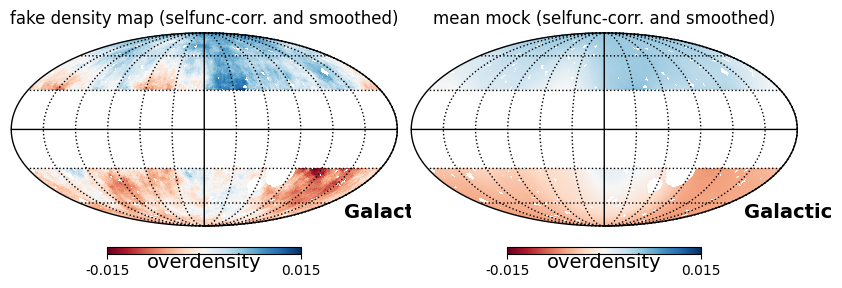

In [43]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.015, max=.015)
hp.mollview(smoothed_odmap_corr, title='fake density map (selfunc-corr. and smoothed)', sub=(1,3,1), **kwargs)
hp.mollview(smoothed_mean_odmap_mock_corr, title='mean mock (selfunc-corr. and smoothed)', sub=(1,3,2), **kwargs)
hp.graticule()

In [55]:
# dipole directions
dipamp_input, dipdir_input = dipole.get_dipole(fake_data['fit_dipole_comps'])
dipamp_posterior, dipdir_posterior = dipole.get_dipole(posterior_dipole_comps)
dipamp_total, dipdir_total = dipole.get_dipole(total_dipole_comps)

print(f"input dipole comps =\t\t", [float(f"{x:.5f}") for x in fake_data['fit_dipole_comps']], f"\tamplitude = {dipamp_input:.4f}")
print(f"posterior dipole comps =\t", [float(f"{x:.5f}") for x in posterior_dipole_comps], f"\tamplitude = {dipamp_posterior:.4f}")
print(f"total dipole comps =\t\t", [float(f"{x:.5f}") for x in total_dipole_comps], f"\tamplitude = {dipamp_total:.4f}")

# we can actually back out the shot noise dipole here — it's just the difference between the total dipole and input (i.e. kinematic) dipole!
# "truth" - "input":
shotnoise_dipole_comps = total_dipole_comps - fake_data['fit_dipole_comps']
dipamp_SN, dipdir_SN = dipole.get_dipole(shotnoise_dipole_comps)
print(f"shot noise dipole comps =\t", [float(f"{x:.5f}") for x in shotnoise_dipole_comps], f"\tamplitude = {dipamp_SN:.4f}")

input dipole comps =		 [-0.00504, 0.00109, -0.00065] 	amplitude = 0.0052
posterior dipole comps =	 [-0.00478, -0.00326, 5e-05] 	amplitude = 0.0058
total dipole comps =		 [-0.00449, -0.0023, -0.00022] 	amplitude = 0.0050
shot noise dipole comps =	 [0.00056, -0.0034, 0.00043] 	amplitude = 0.0035


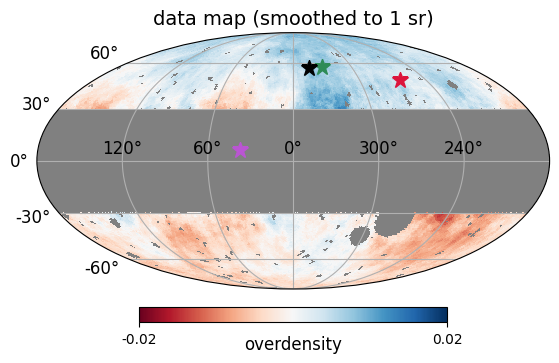

In [57]:
# plot the different recovered dipoles
fig = plt.figure(figsize=(12,4))
hp.projview(smoothed_odmap_corr, title='data map (smoothed to 1 sr)', sub=(1,2,1), min=-.02, max=.02, cmap='RdBu',
           graticule=True, graticule_labels=True, fig=fig, coord=['C','G'], unit='overdensity')
tools.plot_marker(dipdir_total.galactic.l, dipdir_total.galactic.b, marker='*', c='seagreen', ms=12, label='Total')
tools.plot_marker(dipdir_posterior.galactic.l, dipdir_posterior.galactic.b, marker='*', c='k', ms=12, label='Posterior')
tools.plot_marker(dipdir_input.galactic.l, dipdir_input.galactic.b, marker='*', c='crimson', ms=12, label='Input')
tools.plot_marker(dipdir_SN.galactic.l, dipdir_SN.galactic.b, marker='*', c='mediumorchid', ms=12, label='Shot noise')

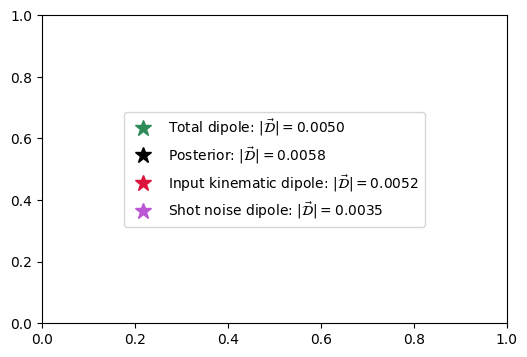

In [58]:
fig, ax = plt.subplots(figsize=(6,4))
kwargs = dict(marker='*', ms=12, ls='None')
legend_elements = [mpl.lines.Line2D([0], [0], color='seagreen', label=r'Total dipole: $|\vec{\mathcal{D}}| =$'f'{dipamp_total:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='k', label=r'Posterior: $|\vec{\mathcal{D}}| =$'f'{dipamp_posterior:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='crimson', label=r'Input kinematic dipole: $|\vec{\mathcal{D}}| =$'f'{dipamp_input:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='mediumorchid', label=r'Shot noise dipole: $|\vec{\mathcal{D}}| =$'f'{dipamp_SN:.4f}', **kwargs)]
ax.legend(handles=legend_elements, loc='center')

### perfect completeness: free dipole model

In [95]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = 'zero'
label = f'fake Quaia G20.0 ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, perfect completeness)'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate_quaia:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_sf-ones')

In [96]:
# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole (no SN):	[-0.00504284  0.00109153 -0.00064682]	amplitude = 0.0052
amplitude of the total dipole projected onto the expected dipole direction:	0.00520


In [97]:
# smooth the map
smoothed_odmap_corr = tools.smooth_map(odmap_corr)

Text(0.5, 1.05, 'fake Quaia G20.0 (1.0x expected dipole, log excess = zero, perfect completeness)')

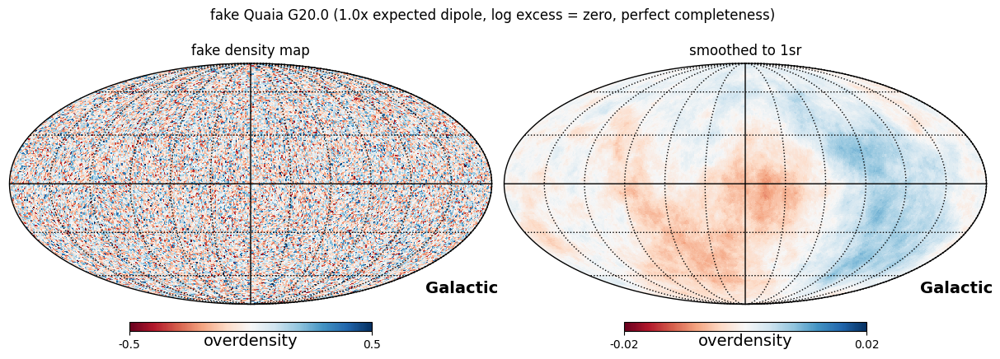

In [98]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,2,1), min=-.5, max=.5, **kwargs)
hp.mollview(smoothed_odmap_corr, title='smoothed to 1sr', sub=(1,2,2), min=-.02, max=.02, **kwargs)
hp.graticule()
fig.suptitle(label, y=1.05)

In [99]:
# the shot noise causes more large-scale over- and under-densities than I might've expected! this will impact the total dipole:
total_dipole_comps = hp.fit_dipole(odmap)[1]
print(f"total dipole = {total_dipole_comps}; amplitude = {np.linalg.norm(total_dipole_comps):.5f}")

total dipole = [-0.00258703  0.00339756 -0.00075865]; amplitude = 0.00434


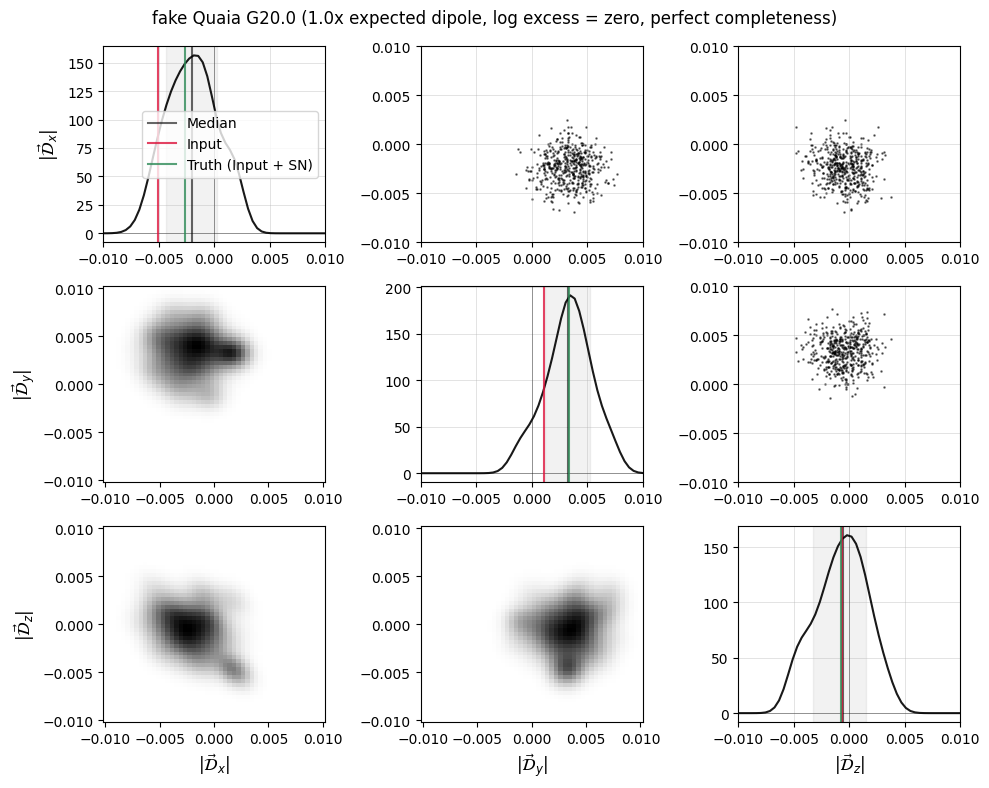

In [100]:
nmocks = 500
qs, res, axs = get_abc_results_free_dipole(os.path.join(case_dir,
                                    f'free_dipole_nside{nside}_{nmocks}mocks_14iters', 'results.npy'), title=label)
for i, comp in enumerate(fake_data['fit_dipole_comps']):
    axs[i,i].axvline(comp, c='crimson', alpha=0.8, label='Input')
    axs[i,i].axvline(total_dipole_comps[i], c='seagreen', alpha=0.8, label='Truth (Input + SN)')
axs[0,0].legend()

In [101]:
posterior_dipole_comps = np.array([q[1] for q in qs])

In [102]:
# dipole directions
dipamp_input, dipdir_input = dipole.get_dipole(fake_data['fit_dipole_comps'])
dipamp_posterior, dipdir_posterior = dipole.get_dipole(posterior_dipole_comps)
dipamp_total, dipdir_total = dipole.get_dipole(total_dipole_comps)

print(f"input dipole comps =\t\t", [float(f"{x:.5f}") for x in fake_data['fit_dipole_comps']], f"\tamplitude = {dipamp_input:.4f}")
print(f"posterior dipole comps =\t", [float(f"{x:.5f}") for x in posterior_dipole_comps], f"\tamplitude = {dipamp_posterior:.4f}")
print(f"total dipole comps =\t\t", [float(f"{x:.5f}") for x in total_dipole_comps], f"\tamplitude = {dipamp_total:.4f}")

# we can actually back out the shot noise dipole here — it's just the difference between the total dipole and input (i.e. kinematic) dipole!
# "truth" - "input":
shotnoise_dipole_comps = total_dipole_comps - fake_data['fit_dipole_comps']
dipamp_SN, dipdir_SN = dipole.get_dipole(shotnoise_dipole_comps)
print(f"shot noise dipole comps =\t", [float(f"{x:.5f}") for x in shotnoise_dipole_comps], f"\tamplitude = {dipamp_SN:.4f}")

input dipole comps =		 [-0.00504, 0.00109, -0.00065] 	amplitude = 0.0052
posterior dipole comps =	 [-0.00197, 0.00326, -0.00054] 	amplitude = 0.0038
total dipole comps =		 [-0.00259, 0.0034, -0.00076] 	amplitude = 0.0043
shot noise dipole comps =	 [0.00246, 0.00231, -0.00011] 	amplitude = 0.0034


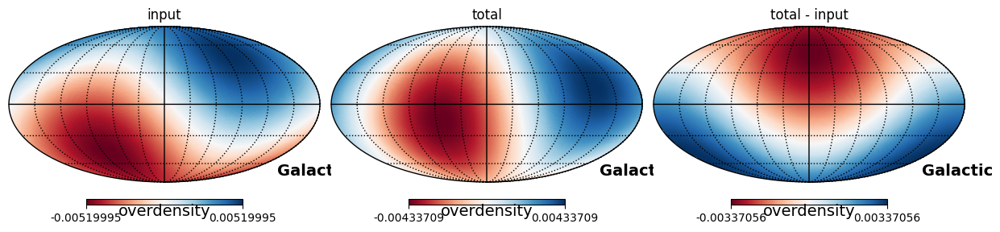

In [103]:
# cross-check the shot noise dipole comps calculation: now do it from the maps
input_dipole_map = dipole.dipole_map(np.append(0, fake_data['fit_dipole_comps']))
total_dipole_map = dipole.dipole_map(np.append(0, total_dipole_comps))
shotnoise_dipole_map = total_dipole_map - input_dipole_map

fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(input_dipole_map, title='input', sub=(1,3,1), **kwargs)
hp.mollview(total_dipole_map, title='total', sub=(1,3,2), **kwargs)
hp.mollview(shotnoise_dipole_map, title='total - input', sub=(1,3,3), **kwargs)
hp.graticule()

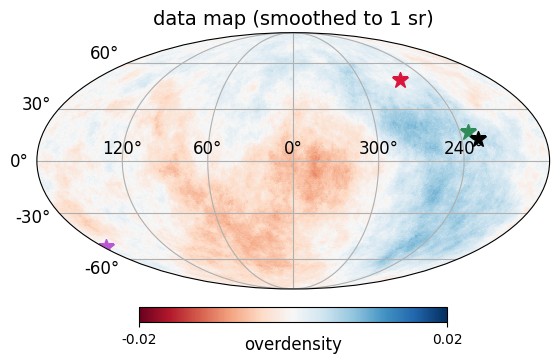

In [24]:
fig = plt.figure(figsize=(12,4))
hp.projview(smoothed_odmap_corr, title='data map (smoothed to 1 sr)', sub=(1,2,1), min=-.02, max=.02, cmap='RdBu',
           graticule=True, graticule_labels=True, fig=fig, coord=['C','G'], unit='overdensity')
tools.plot_marker(dipdir_total.galactic.l, dipdir_total.galactic.b, marker='*', c='seagreen', ms=12, label='Total')
tools.plot_marker(dipdir_posterior.galactic.l, dipdir_posterior.galactic.b, marker='*', c='k', ms=12, label='Posterior')
tools.plot_marker(dipdir_input.galactic.l, dipdir_input.galactic.b, marker='*', c='crimson', ms=12, label='Input')
tools.plot_marker(dipdir_SN.galactic.l, dipdir_SN.galactic.b, marker='*', c='mediumorchid', ms=12, label='Shot noise')

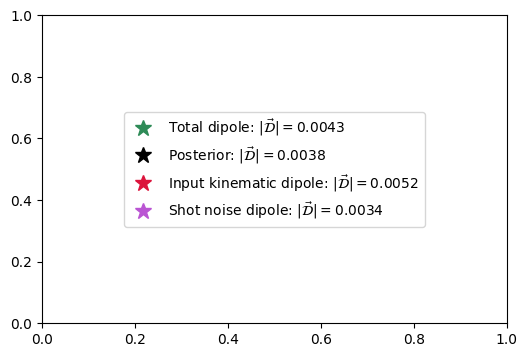

In [35]:
fig, ax = plt.subplots(figsize=(6,4))
kwargs = dict(marker='*', ms=12, ls='None')
legend_elements = [mpl.lines.Line2D([0], [0], color='seagreen', label=r'Total dipole: $|\vec{\mathcal{D}}| =$'f'{dipamp_total:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='k', label=r'Posterior: $|\vec{\mathcal{D}}| =$'f'{dipamp_posterior:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='crimson', label=r'Input kinematic dipole: $|\vec{\mathcal{D}}| =$'f'{dipamp_input:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='mediumorchid', label=r'Shot noise dipole: $|\vec{\mathcal{D}}| =$'f'{dipamp_SN:.4f}', **kwargs)]
ax.legend(handles=legend_elements, loc='center')

In [106]:
tools.C1_from_D(.0034)

1.614080492244356e-05

### fake Quaia G20.0 zodi, 1x dipole, log excess power = -5

In [81]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-5.0'
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess})'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate_quaia:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}')

In [82]:
# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole (no SN):	[-0.00416397  0.00148094  0.00032339]	amplitude = 0.0044
amplitude of the total dipole projected onto the expected dipole direction:	0.00431


In [83]:
# smooth the map
smoothed_odmap_corr = tools.smooth_map(odmap_corr)

Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -5.0)')

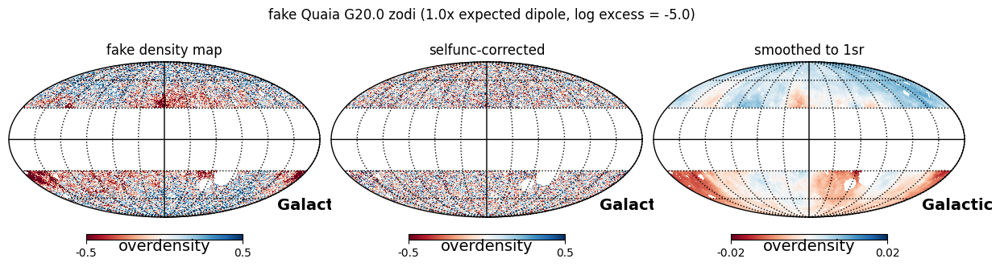

In [84]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.5, max=.5, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.5, max=.5, **kwargs)
hp.mollview(smoothed_odmap_corr, title='smoothed to 1sr', sub=(1,3,3), min=-.02, max=.02, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8)

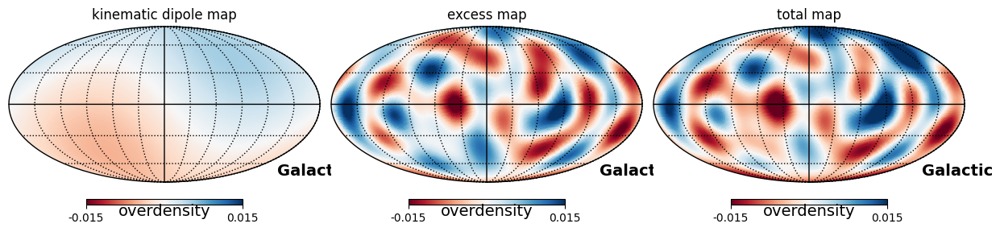

In [85]:
# plot the kinematic dipole and excess power maps
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.015, max=.015)
hp.mollview(input_kin_dipmap, title='kinematic dipole map', sub=(1,3,1), **kwargs)
hp.mollview(excess_map, title='excess map', sub=(1,3,2), **kwargs)
hp.mollview(total_map, title='total map', sub=(1,3,3), **kwargs)
hp.graticule()

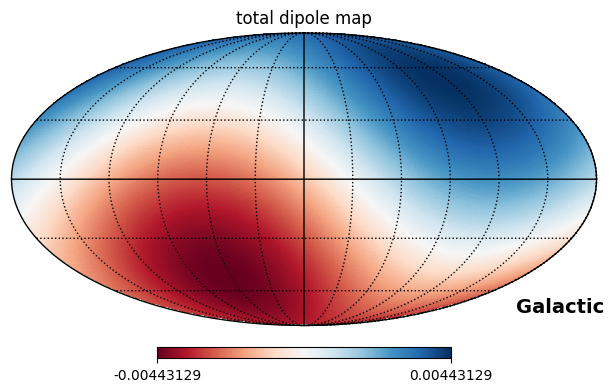

In [86]:
# total dipole in the map (*not including SN! just kinematic + excess, the dipole in the "total map" above
fig = plt.figure(figsize=(12,4))
hp.mollview(dipole.dipole_map(np.append(0, fake_data['fit_dipole_comps'])), title='total dipole map', sub=(1,2,1), cmap='RdBu', coord=['C','G'])
hp.graticule()

#### dipole only model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0057
median dipole_amp = 0.0059
std dipole_amp = 0.0031
z score = -0.2195


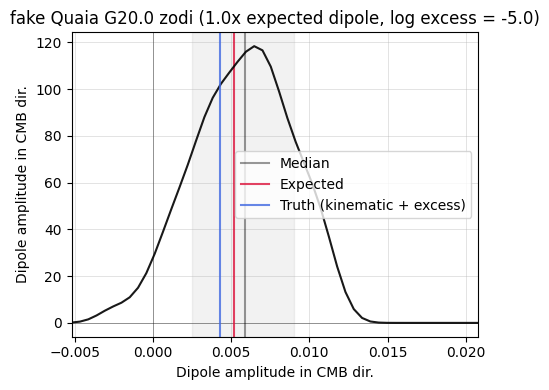

In [87]:
nmocks = 500
q, relamp, z, res, ax = get_abc_results_dipole_only(os.path.join(case_dir,
                                    f'dipole_only_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label)
ax.axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth (kinematic + excess)')
ax.legend()

#### dipole and excess model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0056
median dipole_amp = 0.0054
std dipole_amp = 0.0032
z score = -0.0710


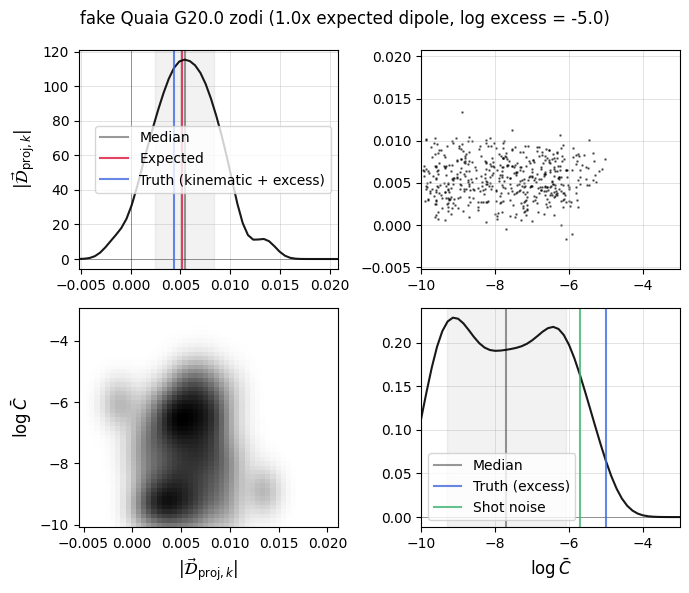

In [88]:
anmocks = 500
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label)
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth (kinematic + excess)')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Truth (excess)')
axs[1,1].axvline(np.log10(1 / Nsources_quaia), c='mediumseagreen', alpha=0.8, label='Shot noise')
axs[0,0].legend()
axs[1,1].legend()

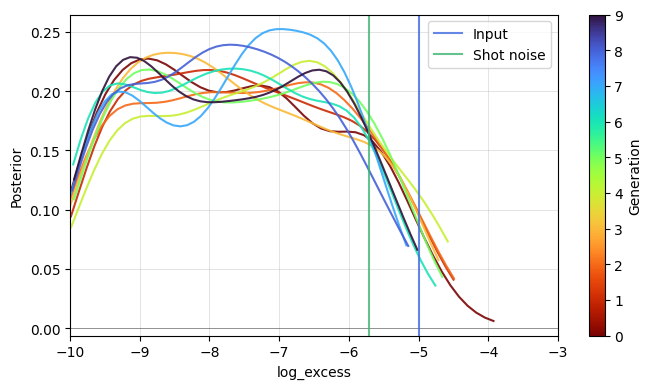

In [89]:
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

In [90]:
# I wonder if the posteriors get "stuck" in the excess power space below shot noise, since those are all consistent?
# the posterior isn't evolving in a clear way, so clearly the entire range <~ -6 is giving ~ the same distance to the data map

#### free dipole model

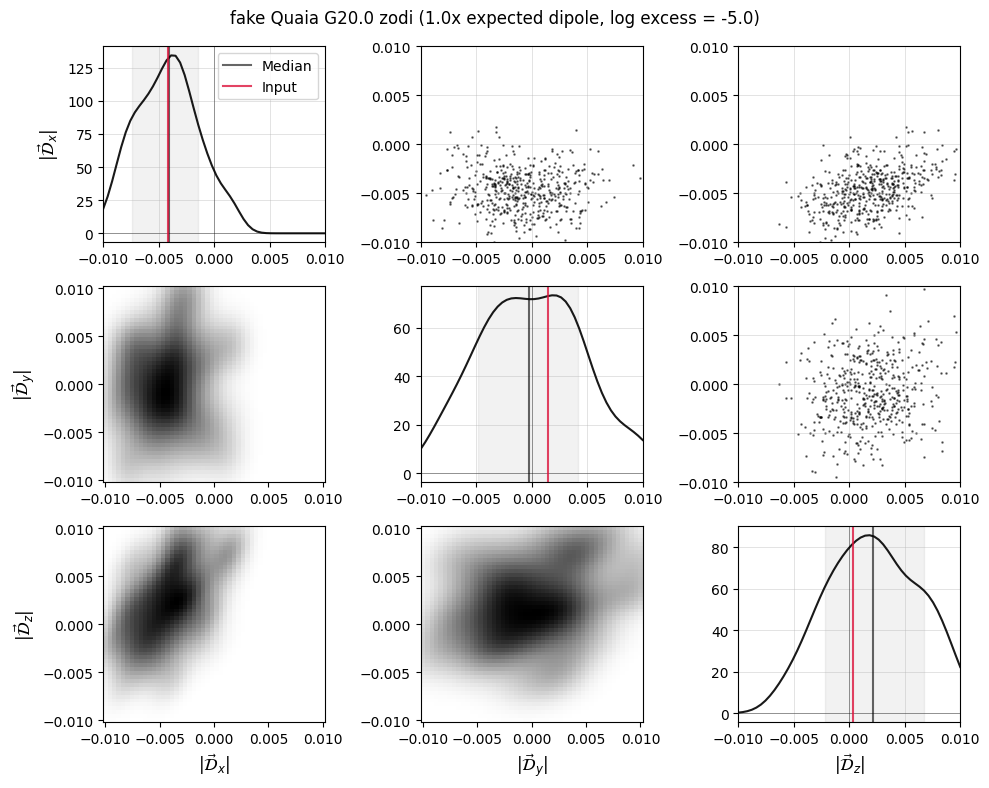

In [91]:
nmocks = 500
qs, res, axs = get_abc_results_free_dipole(os.path.join(case_dir,
                                    f'free_dipole_nside{nside}_{nmocks}mocks_14iters', 'results.npy'), title=label)
for i, comp in enumerate(fake_data['fit_dipole_comps']):
    axs[i,i].axvline(comp, c='crimson', alpha=0.8, label='Input')
axs[0,0].legend()

In [92]:
# dipole components from the posterior, and from healpy least-squares fit
posterior_dipole_comps = np.array([q[1] for q in qs])
total_dipole_comps = hp.fit_dipole(odmap_corr)[1]

# dipole directions
dipamp_input, dipdir_input = dipole.get_dipole(fake_data['fit_dipole_comps'])
dipamp_posterior, dipdir_posterior = dipole.get_dipole(posterior_dipole_comps)
dipamp_total, dipdir_total = dipole.get_dipole(total_dipole_comps)

print(f"input dipole comps =\t\t", [float(f"{x:.5f}") for x in fake_data['fit_dipole_comps']], f"\tamplitude = {dipamp_input:.4f}")
print(f"posterior dipole comps =\t", [float(f"{x:.5f}") for x in posterior_dipole_comps], f"\tamplitude = {dipamp_posterior:.4f}")
print(f"total dipole comps =\t\t", [float(f"{x:.5f}") for x in total_dipole_comps], f"\tamplitude = {dipamp_total:.4f}")

input dipole comps =		 [-0.00416, 0.00148, 0.00032] 	amplitude = 0.0044
posterior dipole comps =	 [-0.00404, -0.00022, 0.00217] 	amplitude = 0.0046
total dipole comps =		 [-0.00452, -0.00127, 0.00177] 	amplitude = 0.0050


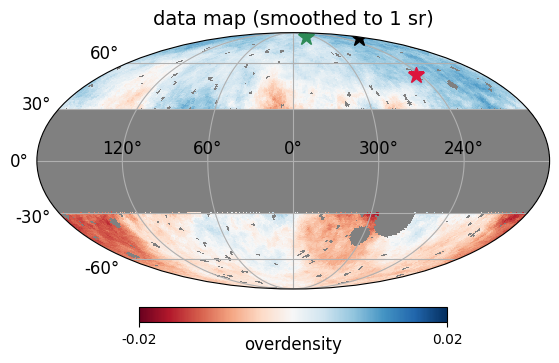

In [93]:
fig = plt.figure(figsize=(12,4))
hp.projview(smoothed_odmap_corr, title='data map (smoothed to 1 sr)', sub=(1,2,1), min=-.02, max=.02, cmap='RdBu',
           graticule=True, graticule_labels=True, fig=fig, coord=['C','G'], unit='overdensity')
tools.plot_marker(dipdir_total.galactic.l, dipdir_total.galactic.b, marker='*', c='seagreen', ms=12, label='Total')
tools.plot_marker(dipdir_posterior.galactic.l, dipdir_posterior.galactic.b, marker='*', c='k', ms=12, label='Posterior')
tools.plot_marker(dipdir_input.galactic.l, dipdir_input.galactic.b, marker='*', c='crimson', ms=12, label='Input')

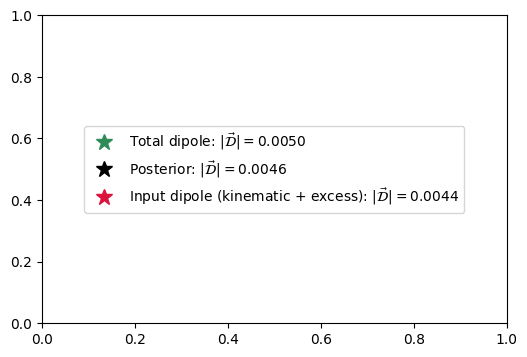

In [94]:
fig, ax = plt.subplots(figsize=(6,4))
kwargs = dict(marker='*', ms=12, ls='None')
legend_elements = [mpl.lines.Line2D([0], [0], color='seagreen', label=r'Total dipole: $|\vec{\mathcal{D}}| =$'f'{dipamp_total:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='k', label=r'Posterior: $|\vec{\mathcal{D}}| =$'f'{dipamp_posterior:.4f}', **kwargs),
                  mpl.lines.Line2D([0], [0], color='crimson', label=r'Input dipole (kinematic + excess): $|\vec{\mathcal{D}}| =$'f'{dipamp_input:.4f}', **kwargs)]
ax.legend(handles=legend_elements, loc='center')

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -5 (no shot noise)

In [22]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-5.0'
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess})'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate_quaia:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_no-SN')

In [23]:
# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole:	[-0.00599581  0.00205109 -0.00120642]	amplitude = 0.0065
amplitude of the total dipole projected onto the expected dipole direction:	0.00640


Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -5.0)')

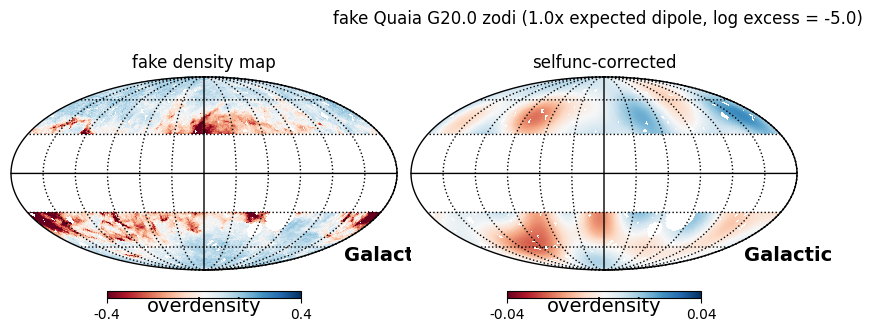

In [24]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.4, max=.4, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.04, max=.04, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8)

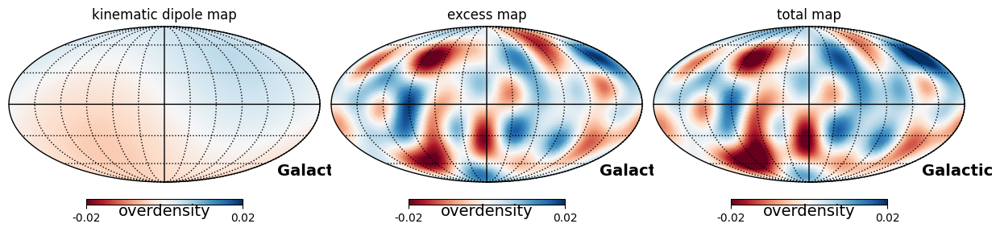

In [25]:
# plot the component maps
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.02, max=.02)
hp.mollview(input_kin_dipmap, title='kinematic dipole map', sub=(1,3,1), **kwargs)
hp.mollview(excess_map, title='excess map', sub=(1,3,2), **kwargs)
hp.mollview(total_map, title='total map', sub=(1,3,3), **kwargs)
hp.graticule()

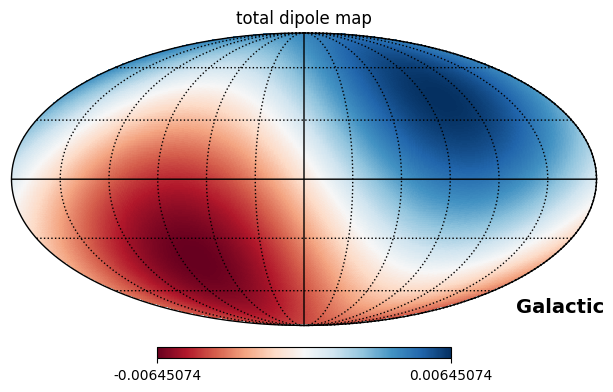

In [26]:
# dipole in the map: fit the dipole using healpy's least-squares fit function
fig = plt.figure(figsize=(12,4))
hp.mollview(dipole.dipole_map(np.append(0, fake_data['fit_dipole_comps'])), title='total dipole map', sub=(1,2,1), cmap='RdBu', coord=['C','G'])
hp.graticule()

#### dipole excess model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0070
median dipole_amp = 0.0070
std dipole_amp = 0.0015
z score = -1.1891


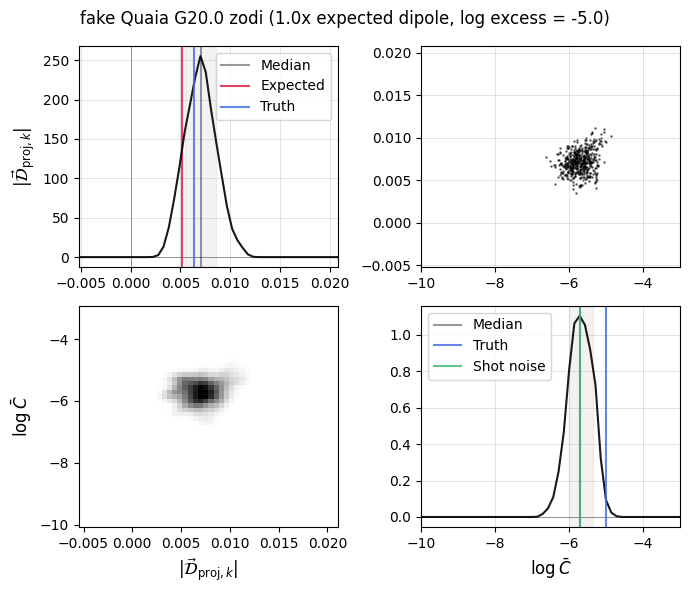

In [27]:
nmocks = 500
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label)
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(np.log10(1 / Nsources_quaia), c='mediumseagreen', alpha=0.8, label='Shot noise')
axs[0,0].legend()
axs[1,1].legend()

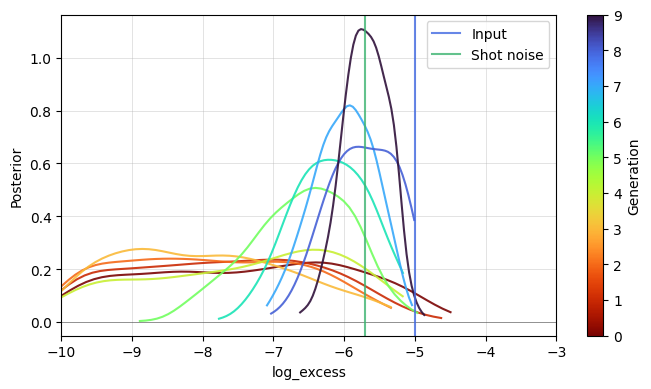

In [28]:
# okay, in this case we are recovering ~ the input excess power! so the issue is the shot noise.
# what does the evolution of the posterior look like?
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -4

In [58]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess})'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate_quaia:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}')

In [59]:
# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole (no SN):	[-0.01254246  0.00174676  0.00788885]	amplitude = 0.0149
amplitude of the total dipole projected onto the expected dipole direction:	0.01155


In [52]:
# smooth the map
smoothed_odmap_corr = tools.smooth_map(odmap_corr)

Text(0.5, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -4.0)')

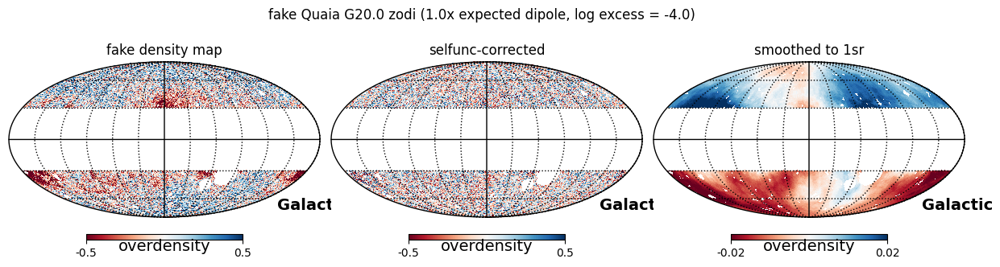

In [53]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.5, max=.5, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.5, max=.5, **kwargs)
hp.mollview(smoothed_odmap_corr, title='smoothed to 1sr', sub=(1,3,3), min=-.02, max=.02, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8)

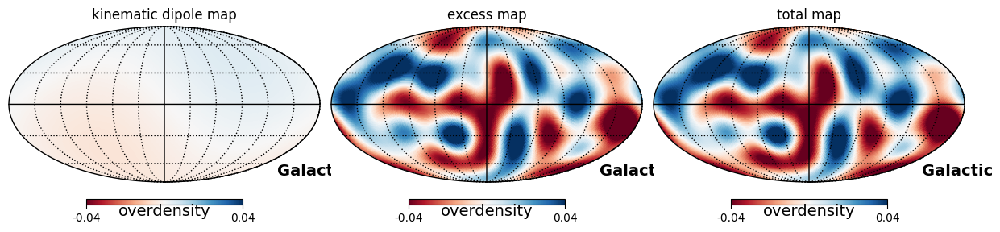

In [54]:
# plot the component maps
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.04, max=.04)
hp.mollview(input_kin_dipmap, title='kinematic dipole map', sub=(1,3,1), **kwargs)
hp.mollview(excess_map, title='excess map', sub=(1,3,2), **kwargs)
hp.mollview(total_map, title='total map', sub=(1,3,3), **kwargs)
hp.graticule()

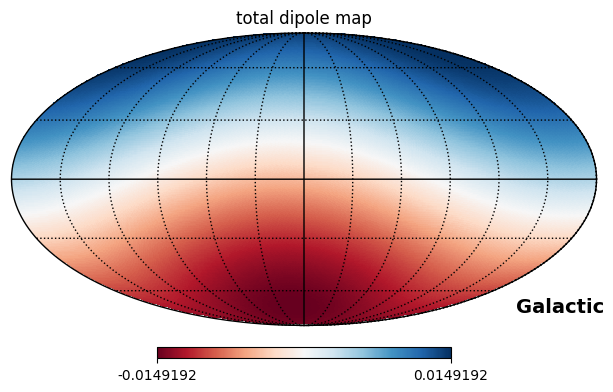

In [55]:
# dipole in the map: fit the dipole using healpy's least-squares fit function
fig = plt.figure(figsize=(12,4))
hp.mollview(dipole.dipole_map(np.append(0, fake_data['fit_dipole_comps'])), title='total dipole map', sub=(1,2,1), cmap='RdBu', coord=['C','G'])
hp.graticule()

#### dipole only model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0122
median dipole_amp = 0.0121
std dipole_amp = 0.0036
z score = -1.9087


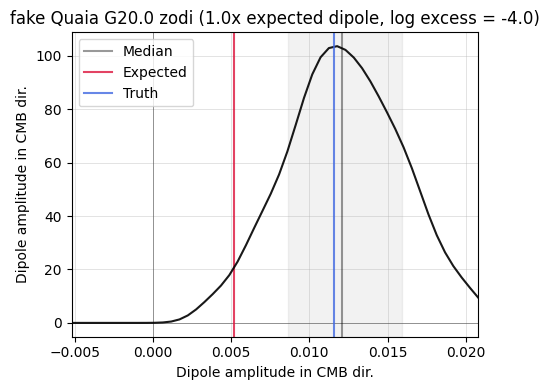

In [18]:
nmocks = 500
q, relamp, z, res, ax = get_abc_results_dipole_only(os.path.join(case_dir,
                                    f'dipole_only_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label)
ax.axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
ax.legend()

#### dipole and excess model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0123
median dipole_amp = 0.0124
std dipole_amp = 0.0032
z score = -2.2388


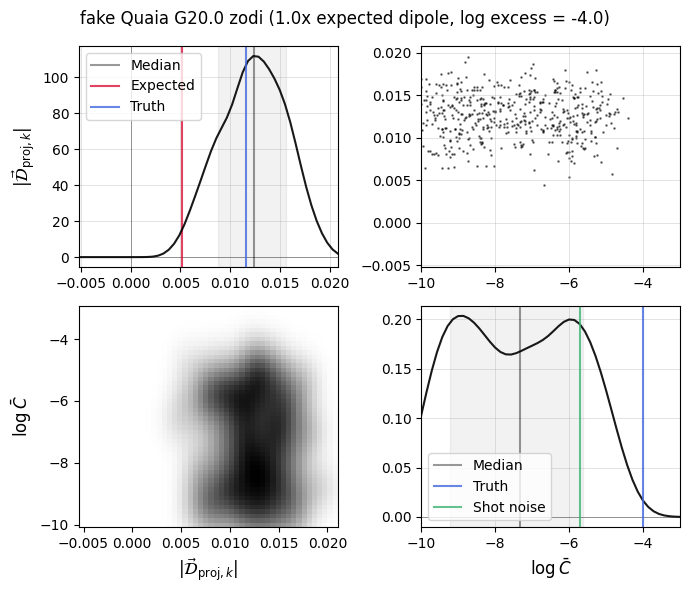

In [19]:
nmocks = 500
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label)
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(np.log10(1 / Nsources_quaia), c='mediumseagreen', alpha=0.8, label='Shot noise')
axs[0,0].legend()
axs[1,1].legend()

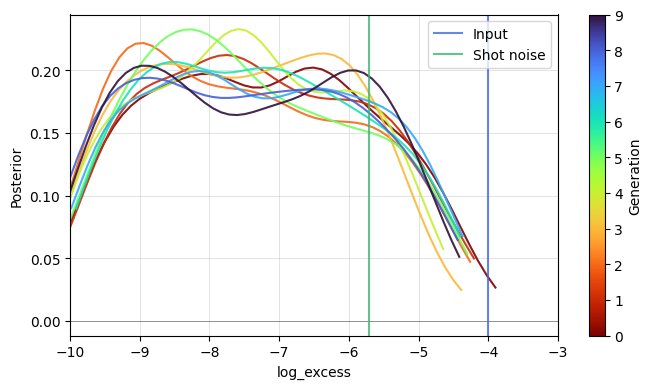

In [20]:
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -4 (no shot noise)

In [21]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess})'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate_quaia:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_no-SN')

In [22]:
# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole:	[-0.01668743  0.00101542 -0.00433114]	amplitude = 0.0173
amplitude of the total dipole projected onto the expected dipole direction:	0.01693


Text(0.4, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -4.0)')

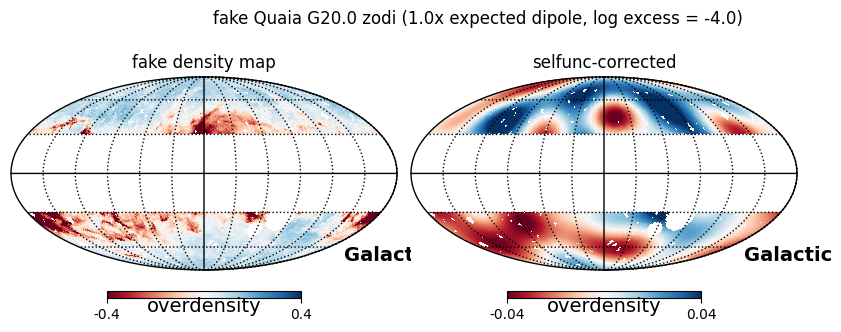

In [23]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.4, max=.4, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.04, max=.04, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8, x=0.4)

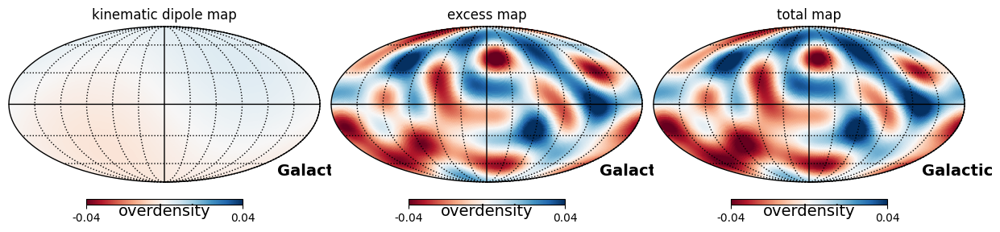

In [24]:
# plot the component maps
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.04, max=.04)
hp.mollview(input_kin_dipmap, title='kinematic dipole map', sub=(1,3,1), **kwargs)
hp.mollview(excess_map, title='excess map', sub=(1,3,2), **kwargs)
hp.mollview(total_map, title='total map', sub=(1,3,3), **kwargs)
hp.graticule()

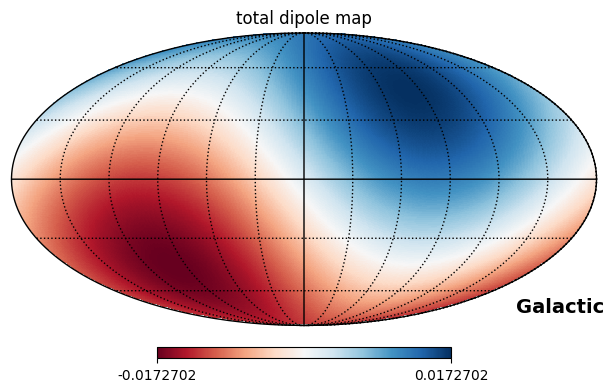

In [25]:
# dipole in the map: fit the dipole using healpy's least-squares fit function
fig = plt.figure(figsize=(12,4))
hp.mollview(dipole.dipole_map(np.append(0, fake_data['fit_dipole_comps'])), title='total dipole map', sub=(1,2,1), cmap='RdBu', coord=['C','G'])
hp.graticule()

#### dipole excess model

expected dipole_amp = 0.0052
mean dipole_amp = 0.0154
median dipole_amp = 0.0158
std dipole_amp = 0.0035
z score = -3.0041


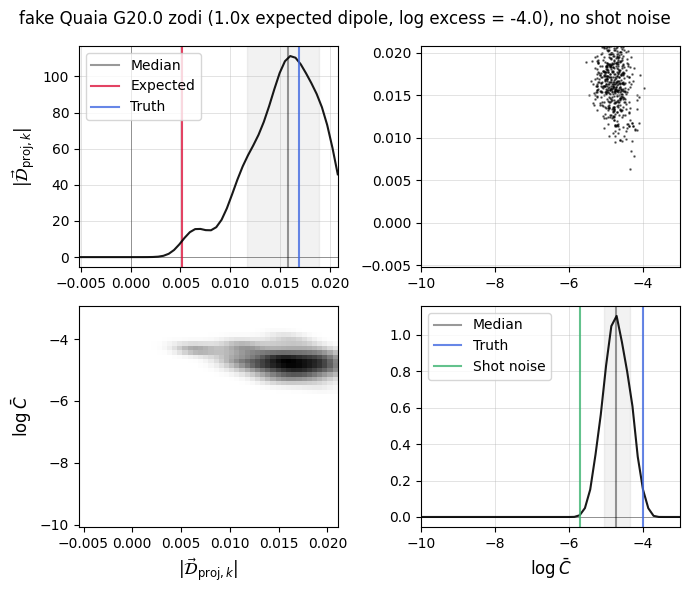

In [26]:
nmocks = 500
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters', 'results.npy'), title=label + ', no shot noise')
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(np.log10(1 / Nsources_quaia), c='mediumseagreen', alpha=0.8, label='Shot noise')
axs[0,0].legend()
axs[1,1].legend()

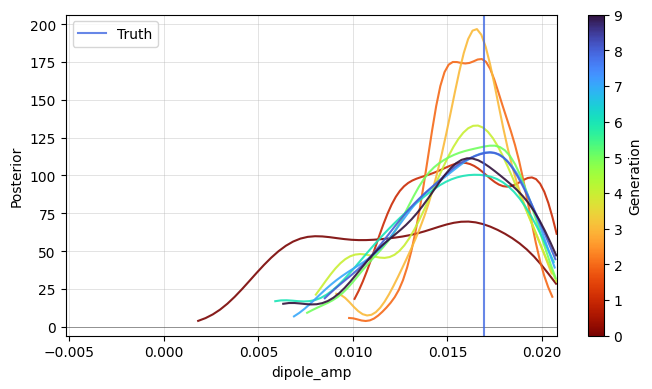

In [27]:
# evolution of the dipole amp posterior
plot_posterior_evolution('dipole_amp', res=res, true_dipamp_proj=true_dipamp_proj)

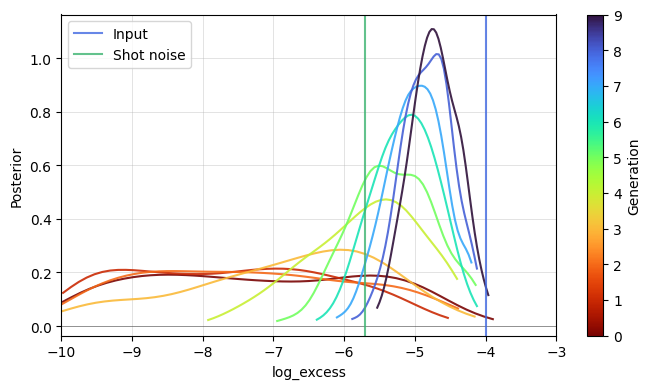

In [28]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -4, excess only up to $\ell=2$

In [73]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rate = base_rate_quaia
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2)'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')

# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole (no SN):	[-0.00190263 -0.00185608 -0.00369925]	amplitude = 0.0046
amplitude of the total dipole projected onto the expected dipole direction:	0.00192


Text(0.4, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -4.0, ell_max = 2)')

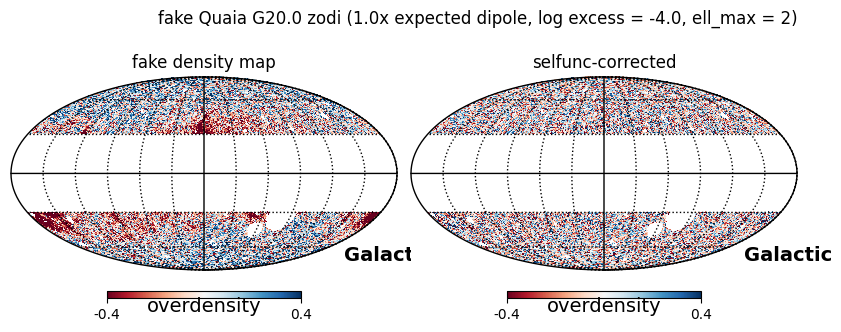

In [74]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.4, max=.4, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.4, max=.4, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8, x=0.4)

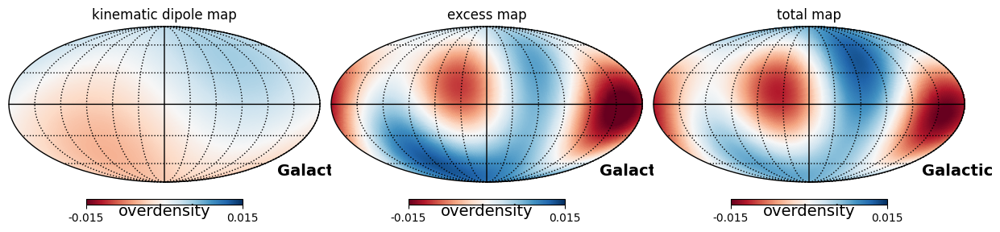

In [75]:
# plot
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.015, max=.015)
hp.mollview(input_kin_dipmap, title='kinematic dipole map', sub=(1,3,1), **kwargs)
hp.mollview(excess_map, title='excess map', sub=(1,3,2), **kwargs)
hp.mollview(total_map, title='total map', sub=(1,3,3), **kwargs)
hp.graticule()

In [76]:
# what is the real excess power in the data, from the Cells?
#   since with the alm draw we might not exactly recover the input Cells spectrum (?)
ells, Cells_excess, alms_excess = multipoles.compute_Cells_in_overdensity_map_Lambda(excess_map,
                                                                Lambda=0.,
                                                                max_ell=2, # magic
                                                                selfunc=np.ones_like(odmap), # because this is the true input, perfect completeness
                                                                return_alms=True)
ells, Cells_total, alms_total = multipoles.compute_Cells_in_overdensity_map_Lambda(total_map,
                                                                Lambda=0.,
                                                                max_ell=2, # magic
                                                                selfunc=np.ones_like(odmap), # because this is the true input, perfect completeness
                                                                return_alms=True)
truth_excess = np.mean(Cells_excess[1:])
truth_total = np.mean(Cells_total[1:])
truth_excess, truth_total

(6.763974601183134e-05, 6.267102031418248e-05)

#### dipole excess model, data and ABC only up to $\ell = 2$

expected dipole_amp = 0.0052
mean dipole_amp = 0.0006
median dipole_amp = 0.0002
std dipole_amp = 0.0033
z score = 1.5347


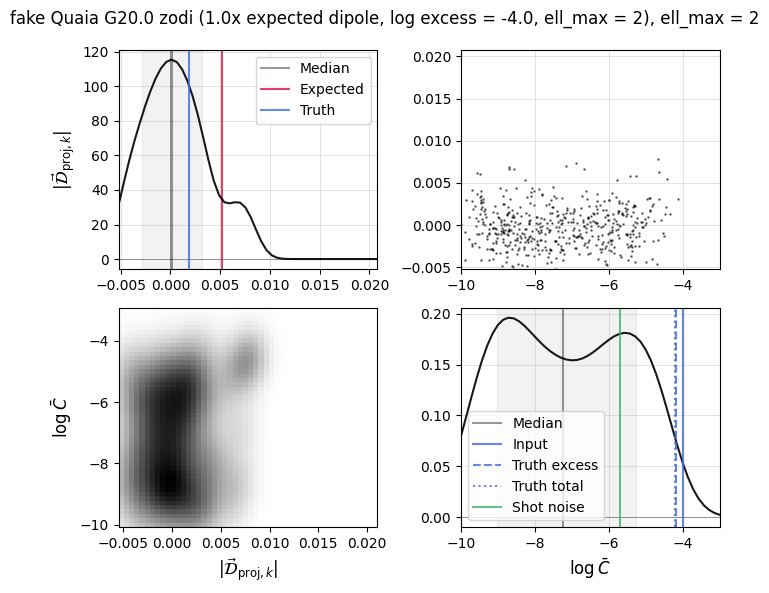

In [77]:
nmocks = 500
ell_max = 2
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}', 'results.npy'),
                                                                     title=label + f', ell_max = {ell_max}')
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(np.log10(truth_excess), c='royalblue', alpha=0.8, ls='--', label='Truth excess')
axs[1,1].axvline(np.log10(truth_total), c='royalblue', alpha=0.8, ls=':', label='Truth total')
axs[1,1].axvline(np.log10(1 / Nsources_quaia), c='mediumseagreen', alpha=0.8, label='Shot noise')
axs[0,0].legend()
axs[1,1].legend()

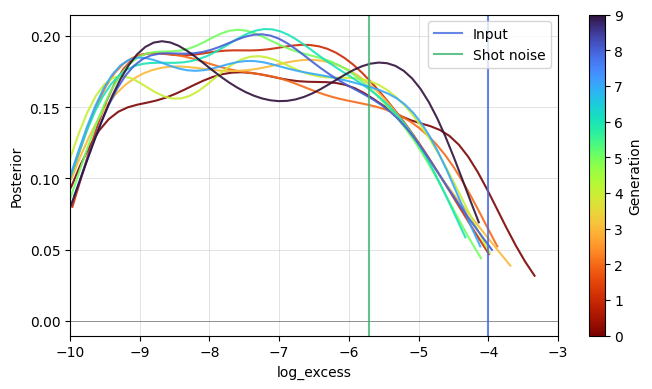

In [78]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

#### dipole excess model, data and ABC only up to $\ell=2$, `QuantileEpsilon` `alpha = 0.4`

In [79]:
nmocks = 500
db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}',
                                       'QuantileEpsilon_alpha-0.4', f'history.db')
history = pyabc.History("sqlite:///" + db_path)

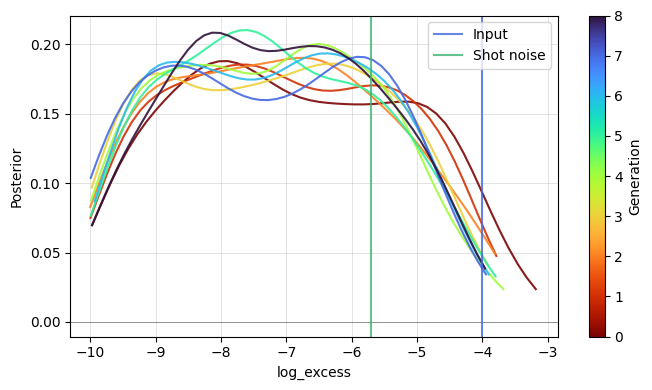

In [80]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', history=history, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

#### dipole excess model, data and ABC only up to $\ell=2$, `QuantileEpsilon` `alpha = 0.2`

In [81]:
nmocks = 500
db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}',
                                       'QuantileEpsilon_alpha-0.2', f'history.db')
history = pyabc.History("sqlite:///" + db_path)

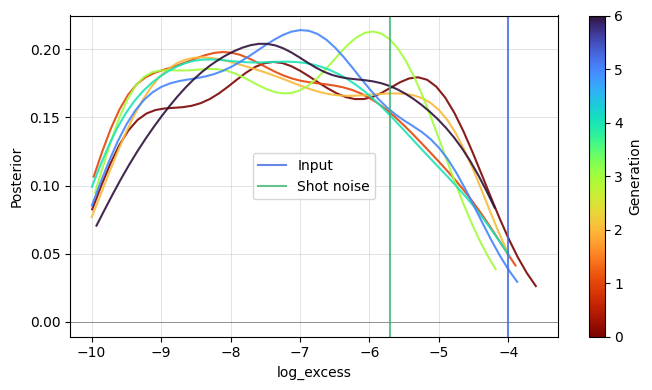

In [82]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', history=history, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

#### dipole excess model, data and ABC only up to $\ell=2$, `QuantileEpsilon` `alpha = 0.2`, 1000 mocks per generation

In [83]:
nmocks = 1000
db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_6iters_ellmax-{ell_max}',
                                       'QuantileEpsilon_alpha-0.2', f'history.db')
history = pyabc.History("sqlite:///" + db_path)

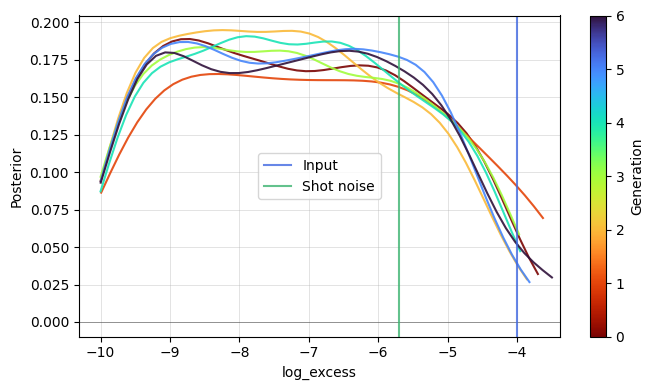

In [84]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', history=history, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

#### dipole excess model, data and ABC only up to $\ell=2$, `QuantileEpsilon` `alpha = 0.2`, 2000 mocks per generation

In [85]:
nmocks = 2000
db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_6iters_ellmax-{ell_max}',
                                       'QuantileEpsilon_alpha-0.2', f'history.db')
history = pyabc.History("sqlite:///" + db_path)

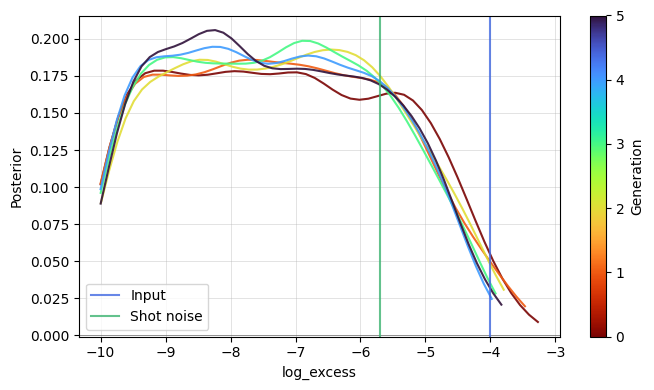

In [86]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', history=history, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

#### dipole excess model, data and ABC only up to $\ell=2$, `QuantileEpsilon` `alpha = 0.1`, 2000 mocks per generation

In [87]:
nmocks = 2000
db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_6iters_ellmax-{ell_max}',
                                       'QuantileEpsilon_alpha-0.1', f'history.db')
history = pyabc.History("sqlite:///" + db_path)

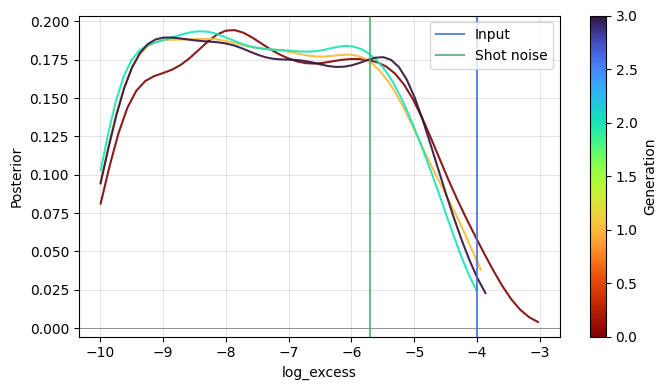

In [88]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', history=history, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

### comparing base rates: fake Quaia G20.0 zodi, log excess power = -4, excess only up to $\ell=2$

50.0 5
60.0 5
70.0 5
80.0 5


Text(0.5, 0.98, 'log excess power posteriors, Quaia G20.0-like, excess power up to $\\ell=$2:\n                 6 generations, 500 mocks per generation:\n                 acceptance threshold scheme = QuantileEpsilon(alpha=0.2)')

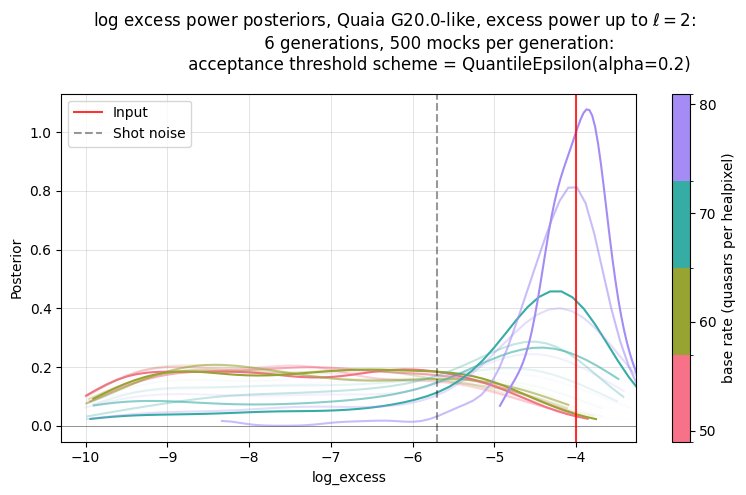

In [56]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rates = [50., 60., 70., 80.]
nmocks = 500
ell_max = 2
ngens = 6

fig, ax = plt.subplots(figsize=(8,5), tight_layout=True)
# evolution of the log excess posterior
# colors = sns.color_palette("husl", len(base_rates))
# cmap = sns.cubehelix_palette(start=.5, rot=-1, as_cmap=True)
colors = sns.husl_palette(len(base_rates))
bnorm = mpl.colors.BoundaryNorm(np.linspace(min(base_rates) - 1, max(base_rates) + 1, len(base_rates) + 1),
                                len(base_rates))
smap = mpl.cm.ScalarMappable(norm=bnorm, cmap=mpl.colors.ListedColormap(colors))

for j, base_rate in enumerate(base_rates):
    case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')
    db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                        f'dipole_excess_nside{nside}_{nmocks}mocks_{ngens}iters_ellmax-{ell_max}',
                                           'QuantileEpsilon_alpha-0.2', f'history.db')
    history = pyabc.History("sqlite:///" + db_path)
    print(base_rate, history.max_t)
                                                                     
    for i in range(history.max_t + 1):
        alpha = (i + 1)**3 / (history.max_t + 1)**3
        pyabc.visualization.plot_kde_1d_highlevel(history, 'log_excess', t=i, ax=ax, color=colors[j], alpha=alpha)
        
ax.grid(alpha=0.5, lw=0.5)
ax.set_xlabel('log_excess')
ax.axhline(0., c='k', alpha=0.5, lw=0.5)
fig.colorbar(smap, ax=ax, label='base rate (quasars per healpixel)', ticks=base_rates)
ax.axvline(float(log_excess), c='r', alpha=0.8, label='Input')
ax.axvline(np.log10(1 / Nsources_quaia), c='k', alpha=0.4, ls='--', label='Shot noise')
ax.legend()
fig.suptitle(f'log excess power posteriors, Quaia G20.0-like, excess power up to 'r'$\ell=$'f'{ell_max}:\n \
                {ngens} generations, {nmocks} mocks per generation:\n \
                acceptance threshold scheme = QuantileEpsilon(alpha=0.2)')

50.0 5
60.0 5
70.0 5
80.0 5


Text(0.5, 0.98, 'log excess power posteriors, Quaia G20.0-like, excess power up to $\\ell=$2:\n                 6 generations, 500 mocks per generation:\n                 acceptance threshold scheme = QuantileEpsilon(alpha=0.5)')

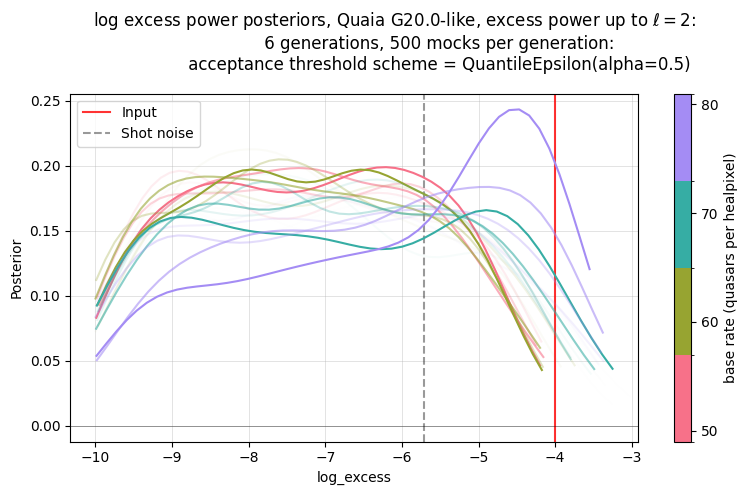

In [57]:
# same thing but with the default acceptance scheme
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rates = [50., 60., 70., 80.]
nmocks = 500
ell_max = 2
ngens = 6

fig, ax = plt.subplots(figsize=(8,5), tight_layout=True)
# evolution of the log excess posterior
# colors = sns.color_palette("husl", len(base_rates))
# cmap = sns.cubehelix_palette(start=.5, rot=-1, as_cmap=True)
colors = sns.husl_palette(len(base_rates))
bnorm = mpl.colors.BoundaryNorm(np.linspace(min(base_rates) - 1, max(base_rates) + 1, len(base_rates) + 1),
                                len(base_rates))
smap = mpl.cm.ScalarMappable(norm=bnorm, cmap=mpl.colors.ListedColormap(colors))

# vertical lines
ax.axvline(float(log_excess), c='r', alpha=0.8, label='Input')
ax.axvline(np.log10(1 / Nsources_quaia), c='k', alpha=0.4, ls='--', label='Shot noise')

for j, base_rate in enumerate(base_rates):
    case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')
    db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                        f'dipole_excess_nside{nside}_{nmocks}mocks_{ngens}iters_ellmax-{ell_max}',
                                           f'history.db')
    history = pyabc.History("sqlite:///" + db_path)
    print(base_rate, history.max_t)
                                                                     
    for i in range(history.max_t + 1):
        alpha = (i + 1)**3 / (history.max_t + 1)**3
        pyabc.visualization.plot_kde_1d_highlevel(history, 'log_excess', t=i, ax=ax, color=colors[j], alpha=alpha)
        
ax.grid(alpha=0.5, lw=0.5)
ax.set_xlabel('log_excess')
ax.axhline(0., c='k', alpha=0.5, lw=0.5)
fig.colorbar(smap, ax=ax, label='base rate (quasars per healpixel)', ticks=base_rates)
ax.legend()
fig.suptitle(f'log excess power posteriors, Quaia G20.0-like, excess power up to 'r'$\ell=$'f'{ell_max}:\n \
                {ngens} generations, {nmocks} mocks per generation:\n \
                acceptance threshold scheme = QuantileEpsilon(alpha=0.5)')

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -4, **base rate = 50**, excess only up to $\ell=2$

In [52]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rate = 50.
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2)'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')

# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole:	[-0.00849001  0.00025353  0.00139772]	amplitude = 0.0086
amplitude of the total dipole projected onto the expected dipole direction:	0.00811


#### dipole excess model, data and ABC up to $\ell=2$, `QuantileEpsilon` `alpha = 0.2`, 500 mocks per generation

expected dipole_amp = 0.0052
mean dipole_amp = 0.0089
median dipole_amp = 0.0090
std dipole_amp = 0.0023
z score = -1.6093


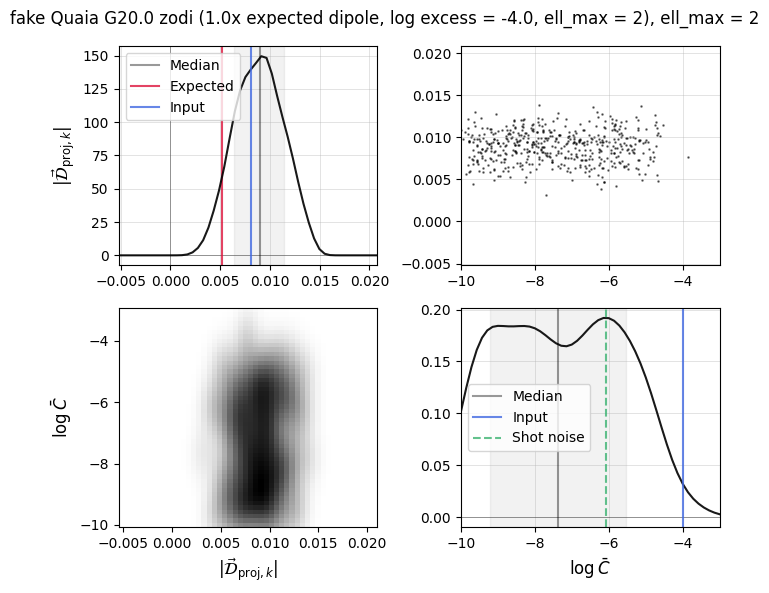

In [54]:
nmocks = 500
ell_max = 2
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_6iters_ellmax-{ell_max}',
                                            'QuantileEpsilon_alpha-0.2', 'results.npy'),
                                                                     title=label + f', ell_max = {ell_max}')
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(np.log10(1 / (base_rate * fake_data['Nunmasked'])), c='mediumseagreen', alpha=0.8, label='Shot noise', ls='--')
axs[0,0].legend()
axs[1,1].legend()

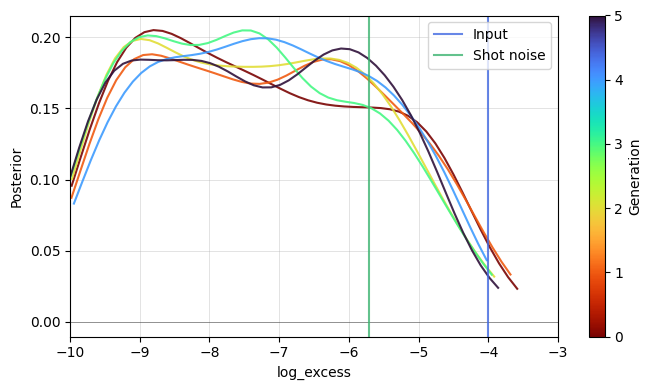

In [55]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=(1 / Nsources_quaia))

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -4, **base rate = 100**, excess only up to $\ell=2$

In [56]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rate = 100.
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2)'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')

# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole:	[-0.01001684 -0.0001348  -0.00942218]	amplitude = 0.0138
amplitude of the total dipole projected onto the expected dipole direction:	0.01086


#### dipole excess model, data and ABC up to $\ell = 2$

expected dipole_amp = 0.0052
mean dipole_amp = 0.0077
median dipole_amp = 0.0076
std dipole_amp = 0.0025
z score = -0.9625


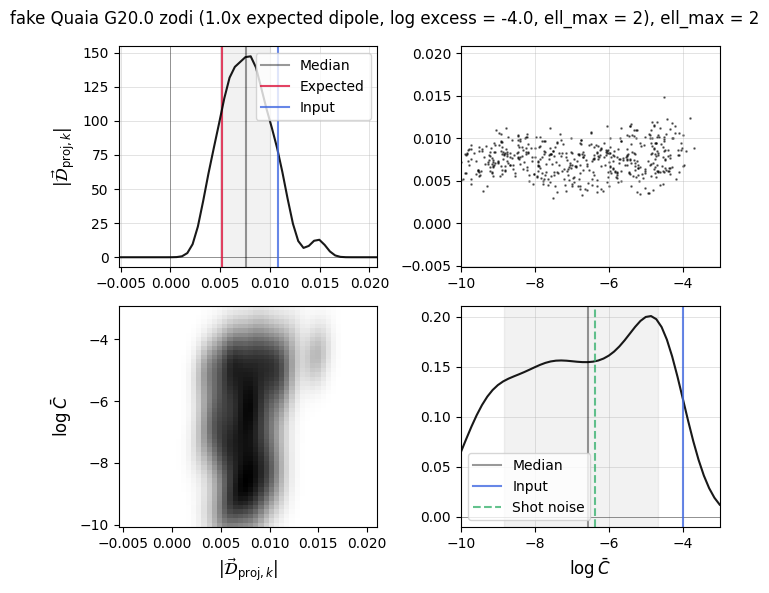

In [57]:
nmocks = 500
ell_max = 2
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}', 'results.npy'),
                                                                     title=label + f', ell_max = {ell_max}')
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(np.log10(1 / (base_rate * fake_data['Nunmasked'])), c='mediumseagreen', alpha=0.8, label='Shot noise', ls='--')
axs[0,0].legend()
axs[1,1].legend()

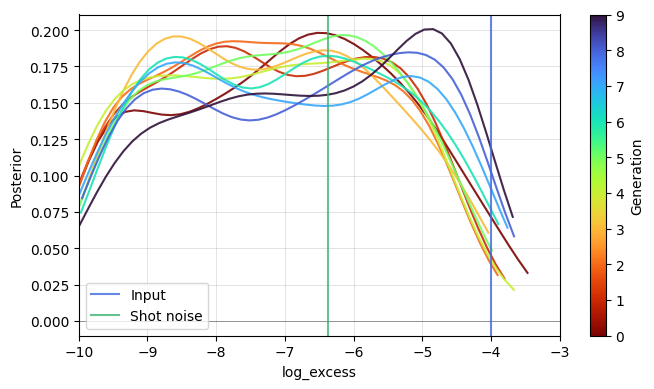

In [58]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=1 / (base_rate * fake_data['Nunmasked']))

#### dipole excess model, data and ABC only up to $\ell=2$, `QuantileEpsilon` `alpha = 0.2`

expected dipole_amp = 0.0052
mean dipole_amp = 0.0088
median dipole_amp = 0.0083
std dipole_amp = 0.0034
z score = -0.9007


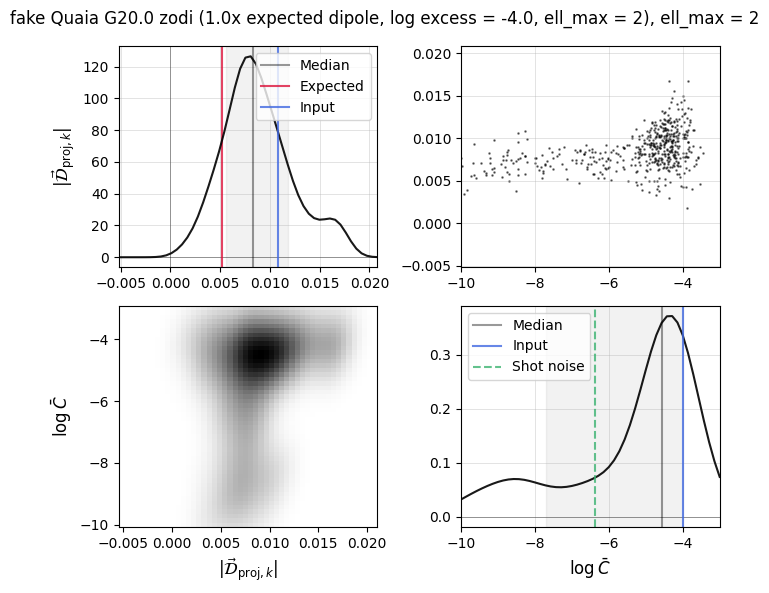

In [59]:
nmocks = 500
ell_max = 2
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_6iters_ellmax-{ell_max}',
                                            'QuantileEpsilon_alpha-0.2', 'results.npy'),
                                                                     title=label + f', ell_max = {ell_max}')
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(np.log10(1 / (base_rate * fake_data['Nunmasked'])), c='mediumseagreen', alpha=0.8, label='Shot noise', ls='--')
axs[0,0].legend()
axs[1,1].legend()

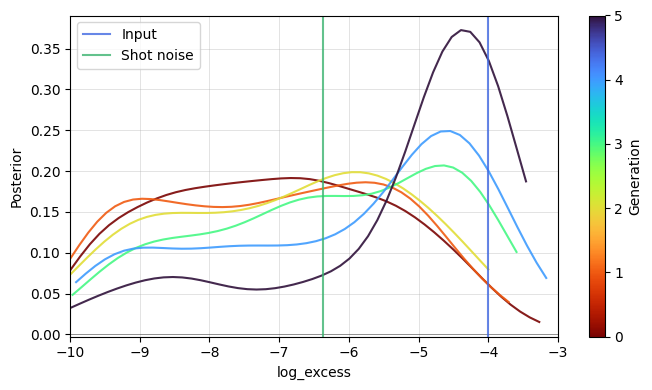

In [60]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=1 / (base_rate * fake_data['Nunmasked']))

#### dipole excess model, data and ABC only up to $\ell=2$, `QuantileEpsilon` `alpha = 0.2`, 1000 mocks per generation

In [77]:
nmocks = 1000
db_path = os.path.join(tempfile.gettempdir(), case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}',
                                       'QuantileEpsilon_alpha-0.2', f'history.db')
history = pyabc.History("sqlite:///" + db_path)

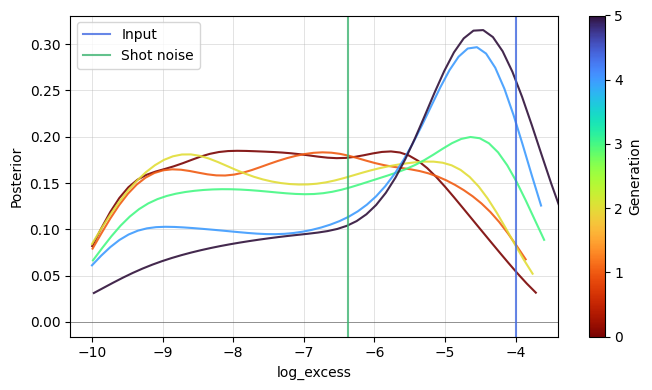

In [78]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', history=history, input_log_excess=log_excess, shotnoise=1 / (base_rate * fake_data['Nunmasked']))

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -4, **base rate = 200**, excess only up to $\ell=2$

In [66]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rate = 200.
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2)'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')

# load the fake data info using the helper function
fake_data = get_fake_data(case_dir)
odmap, odmap_corr = fake_data['odmap'], fake_data['odmap_corr']
input_kin_dipmap, excess_map, total_map = fake_data['input_kin_dipmap'], fake_data['excess_map'], fake_data['total_map']
true_dipamp_proj = fake_data['true_dipamp_proj']

best-fit dipole:	[-0.00858225 -0.00151636  0.00292743]	amplitude = 0.0092
amplitude of the total dipole projected onto the expected dipole direction:	0.00764


Text(0.4, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -4.0, ell_max = 2)')

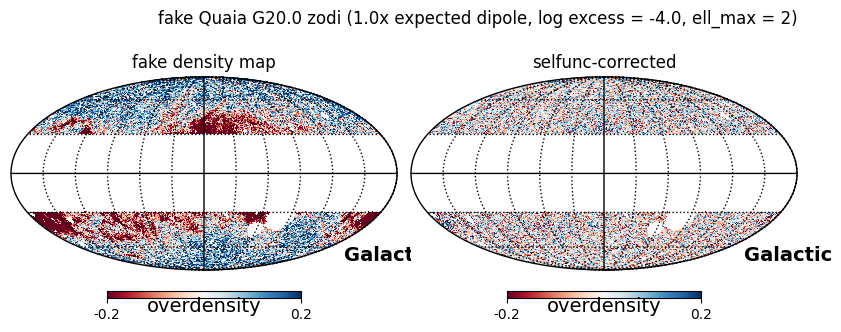

In [67]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.2, max=.2, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.2, max=.2, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8, x=0.4)

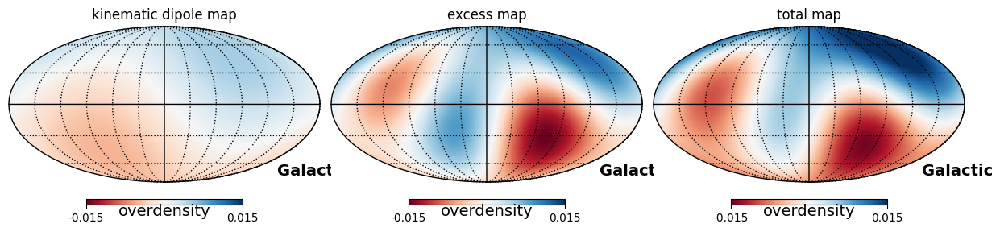

In [68]:
# plot
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.015, max=.015)
hp.mollview(input_kin_dipmap, title='kinematic dipole map', sub=(1,3,1), **kwargs)
hp.mollview(excess_map, title='excess map', sub=(1,3,2), **kwargs)
hp.mollview(total_map, title='total map', sub=(1,3,3), **kwargs)
hp.graticule()

In [69]:
# what is the real excess power in the data, from the Cells?
#   since with the alm draw we might not exactly recover the input Cells spectrum (?)
ells, Cells_excess, alms_excess = multipoles.compute_Cells_in_overdensity_map_Lambda(excess_map,
                                                                Lambda=0.,
                                                                max_ell=2, # magic
                                                                selfunc=np.ones_like(odmap), # because this is the true input, perfect completeness
                                                                return_alms=True)
ells, Cells_total, alms_total = multipoles.compute_Cells_in_overdensity_map_Lambda(total_map,
                                                                Lambda=0.,
                                                                max_ell=2, # magic
                                                                selfunc=np.ones_like(odmap), # because this is the true input, perfect completeness
                                                                return_alms=True)
truth_excess = np.mean(Cells_excess[1:])
truth_total = np.mean(Cells_total[1:])
truth_excess, truth_total

(5.736107687894045e-05, 9.395745334335771e-05)

expected dipole_amp = 0.0052
mean dipole_amp = 0.0087
median dipole_amp = 0.0090
std dipole_amp = 0.0027
z score = -1.4106


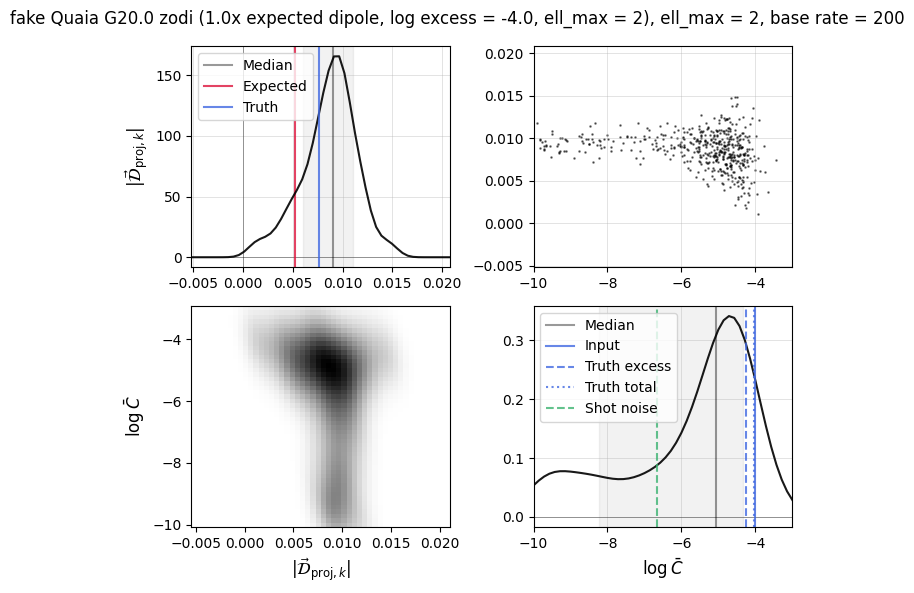

In [71]:
nmocks = 500
ell_max = 2
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}', 'results.npy'),
                                                                     title=label + f', ell_max = {ell_max}, base rate = {base_rate:.0f}')
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(np.log10(truth_excess), c='royalblue', alpha=0.8, ls='--', label='Truth excess')
axs[1,1].axvline(np.log10(truth_total), c='royalblue', alpha=0.8, ls=':', label='Truth total')
axs[1,1].axvline(np.log10(1 / (base_rate * fake_data['Nunmasked'])), c='mediumseagreen', alpha=0.8, label='Shot noise', ls='--')
axs[0,0].legend()
axs[1,1].legend()

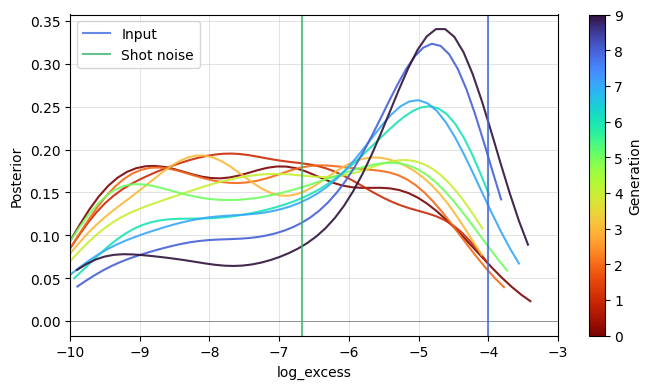

In [73]:
# evolution of the log excess posterior
plot_posterior_evolution('log_excess', res=res, input_log_excess=log_excess, shotnoise=1 / (base_rate * fake_data['Nunmasked']))

## fake Quaia G20.0 zodi, 1x dipole, log excess power = -4, **base rate = 300**, excess only up to $\ell=2$

In [80]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rate = 300.
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2)'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')

# load fake data info: get the data map and convert to overdensity
fake_data = np.load(os.path.join(case_dir, 'fake_data.npy'), allow_pickle=True).item()
qmap = fake_data['data']['data'].astype(float)
Nunmasked = np.sum(qmap != 0.)
qmap[qmap == 0.] = np.nan

# selfunc-corrected
qmap_corr = qmap / fake_data['selfunc']

# overdensity
odmap = qmap / np.nanmean(qmap) - 1
odmap_corr = qmap_corr / np.nanmean(qmap_corr) - 1

# back out the dipole 3-vector from the input amplitude and CMB dipole direction
input_kin_dipole_comps = dipole.cmb_dipole(amplitude=fake_data['input_dipole_amp'], return_comps=True)

# construct the kinematic dipole and excess power maps
input_kin_dipmap = dipole.dipole_map(np.append(0, input_kin_dipole_comps))
excess_map = hp.sphtfunc.alm2map(fake_data['alms'], 64)
total_map = input_kin_dipmap + excess_map

# dipole in the map: fit the dipole using healpy's least-squares fit function
#  we trust this to give us the true dipole since we're working on the full sky
fit_dipole_comps = hp.fit_dipole(total_map)[1]
print(f"best-fit dipole:\t{fit_dipole_comps}\tamplitude = {np.linalg.norm(fit_dipole_comps):.4f}")

# projection of the total dipole onto the CMB dipole direction
proj = (np.dot(input_kin_dipole_comps, fit_dipole_comps)/np.linalg.norm(input_kin_dipole_comps)**2)*input_kin_dipole_comps
true_dipamp_proj = np.linalg.norm(proj)
print(f"amplitude of the total dipole projected onto the expected dipole direction:\t{true_dipamp_proj:.5f}")

best-fit dipole:	[-0.00446202  0.00020896 -0.00178262]	amplitude = 0.0048
amplitude of the total dipole projected onto the expected dipole direction:	0.00459


Text(0.4, 0.8, 'fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -4.0, ell_max = 2)')

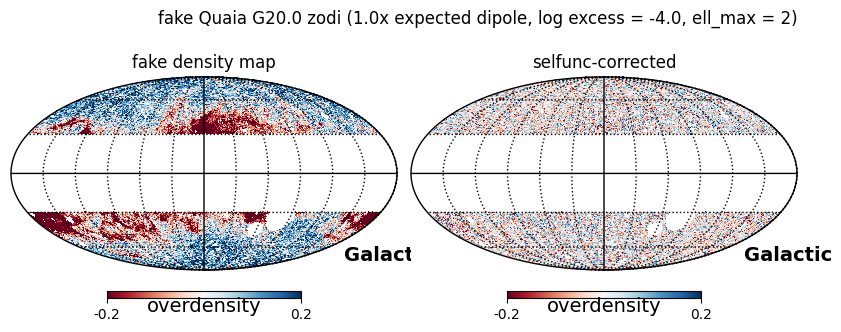

In [81]:
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu')
hp.mollview(odmap, title='fake density map', sub=(1,3,1), min=-.2, max=.2, **kwargs)
hp.mollview(odmap_corr, title='selfunc-corrected', sub=(1,3,2), min=-.2, max=.2, **kwargs)
hp.graticule()
fig.suptitle(label, y=0.8, x=0.4)

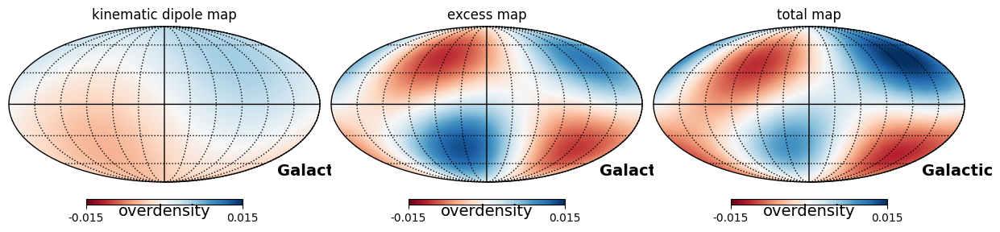

In [82]:
# plot
fig = plt.figure(figsize=(12,4))
kwargs = dict(coord=['C','G'], unit='overdensity', badcolor='w', cmap='RdBu', min=-.015, max=.015)
hp.mollview(input_kin_dipmap, title='kinematic dipole map', sub=(1,3,1), **kwargs)
hp.mollview(excess_map, title='excess map', sub=(1,3,2), **kwargs)
hp.mollview(total_map, title='total map', sub=(1,3,3), **kwargs)
hp.graticule()

In [83]:
# what is the real excess power in the data, from the Cells?
#   since with the alm draw we might not exactly recover the input Cells spectrum (?)
ells, Cells_excess, alms_excess = multipoles.compute_Cells_in_overdensity_map_Lambda(excess_map,
                                                                Lambda=0.,
                                                                max_ell=2, # magic
                                                                selfunc=np.ones_like(odmap), # because this is the true input, perfect completeness
                                                                return_alms=True)
ells, Cells_total, alms_total = multipoles.compute_Cells_in_overdensity_map_Lambda(total_map,
                                                                Lambda=0.,
                                                                max_ell=2, # magic
                                                                selfunc=np.ones_like(odmap), # because this is the true input, perfect completeness
                                                                return_alms=True)
truth_excess = np.mean(Cells_excess[1:])
truth_total = np.mean(Cells_total[1:])
truth_excess, truth_total

(4.597906315070224e-05, 6.044758587283962e-05)

expected dipole_amp = 0.0052
mean dipole_amp = 0.0040
median dipole_amp = 0.0039
std dipole_amp = 0.0037
z score = 0.3548


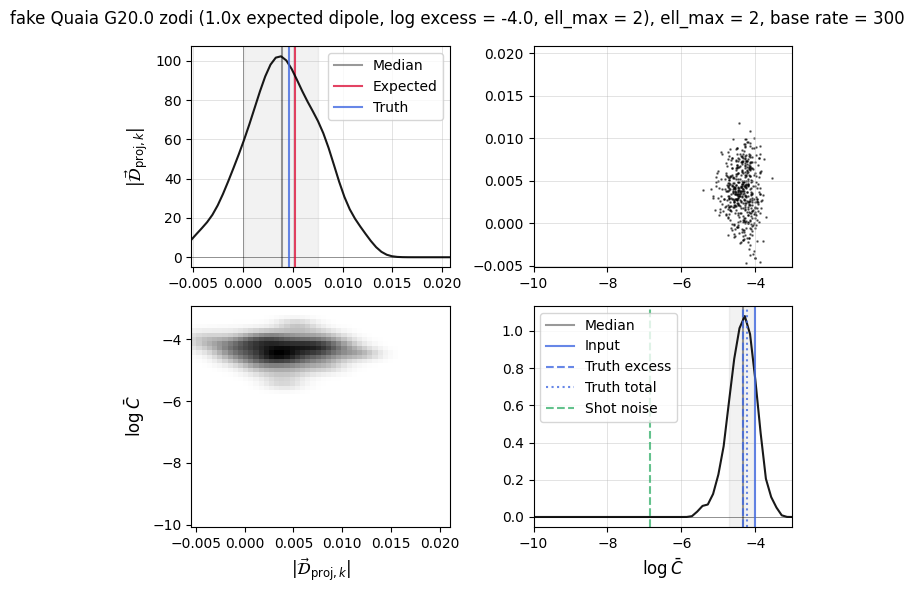

In [84]:
nmocks = 500
ell_max = 2
q_amp, q_excess, relamp, z, res, axs = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}', 'results.npy'),
                                                                     title=label + f', ell_max = {ell_max}, base rate = {base_rate:.0f}')
axs[0,0].axvline(true_dipamp_proj, c='royalblue', alpha=0.8, label='Truth')
axs[1,1].axvline(float(log_excess), c='royalblue', alpha=0.8, label='Input')
axs[1,1].axvline(np.log10(truth_excess), c='royalblue', alpha=0.8, ls='--', label='Truth excess')
axs[1,1].axvline(np.log10(truth_total), c='royalblue', alpha=0.8, ls=':', label='Truth total')
axs[1,1].axvline(np.log10(1 / (base_rate * Nunmasked)), c='mediumseagreen', alpha=0.8, label='Shot noise', ls='--')
axs[0,0].legend()
axs[1,1].legend()

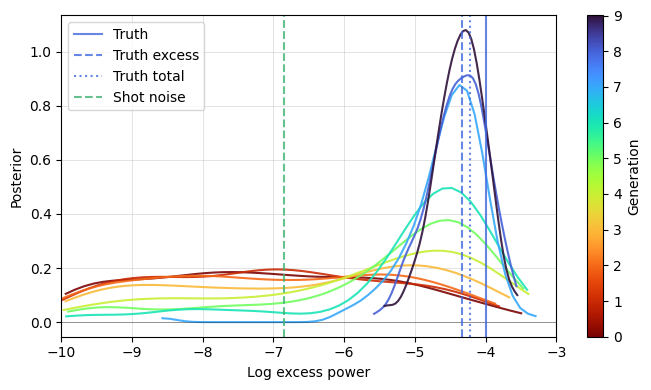

In [87]:
# evolution of the log excess posterior
fig, ax = plt.subplots(figsize=(7,4), tight_layout=True)
norm = mpl.colors.Normalize(vmin=0, vmax=res['history'].max_t)
smap = mpl.cm.ScalarMappable(norm=norm, cmap='turbo_r')
for i in range(res['history'].max_t + 1):
    pyabc.visualization.plot_kde_1d_highlevel(res['history'], "log_excess", t=i, ax=ax, color=smap.to_rgba(i), alpha=0.9)
ax.grid(alpha=0.5, lw=0.5)
ax.set_xlabel('Log excess power')
ax.set_xlim(res['prior']['log_excess'].args[0], res['prior']['log_excess'].args[0] + res['prior']['log_excess'].args[1])
ax.axhline(0., c='k', alpha=0.5, lw=0.5)
fig.colorbar(smap, ax=ax, label='Generation')
ax.axvline(float(log_excess), c='royalblue', alpha=0.8, label='Truth')
ax.axvline(np.log10(truth_excess), c='royalblue', alpha=0.8, ls='--', label='Truth excess')
ax.axvline(np.log10(truth_total), c='royalblue', alpha=0.8, ls=':', label='Truth total')
ax.axvline(np.log10(1 / (base_rate * Nunmasked)), c='mediumseagreen', alpha=0.8, label='Shot noise', ls='--')
ax.legend(loc=2)

### overplot the posteriors with different base rates

In [88]:
base_rates = [100, 200, 300]

# these parameters are the same for all cases
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
nmocks = 500

# where to save results for each case
total_res = {}

for i, base_rate in enumerate(base_rates):
    label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2, base_rate = {base_rate:.0f})'
    case_dir = os.path.join(resdir, f'ABC/fake_data',
                                f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')
    
    # load fake data info: get the data map and convert to overdensity
    fake_data = np.load(os.path.join(case_dir, 'fake_data.npy'), allow_pickle=True).item()
    qmap = fake_data['data']['data'].astype(float)
    Nunmasked = np.sum(qmap != 0.)
    qmap[qmap == 0.] = np.nan
    
    # overdensity
    odmap = qmap / np.nanmean(qmap) - 1
    
    # back out the dipole 3-vector from the input amplitude and CMB dipole direction
    input_kin_dipole_comps = dipole.cmb_dipole(amplitude=fake_data['input_dipole_amp'], return_comps=True)
    
    # construct the kinematic dipole and excess power maps
    input_kin_dipmap = dipole.dipole_map(np.append(0, input_kin_dipole_comps))
    excess_map = hp.sphtfunc.alm2map(fake_data['alms'], 64)
    total_map = input_kin_dipmap + excess_map
    
    # dipole in the map: fit the dipole using healpy's least-squares fit function
    #  we trust this to give us the true dipole since we're working on the full sky
    fit_dipole_comps = hp.fit_dipole(total_map)[1]
    proj = (np.dot(input_kin_dipole_comps, fit_dipole_comps)/np.linalg.norm(input_kin_dipole_comps)**2)*input_kin_dipole_comps
    true_dipamp_proj = np.linalg.norm(proj)

    # load (and plot) results
    q_amp, q_excess, relamp, z, res = get_abc_results_dipole_excess(os.path.join(case_dir,
                                    f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}', 'results.npy'), plot=False)
    total_res[base_rate] = dict(history = res['history'],
                     prior = res['prior'],
                     SN = 1 / (base_rate * Nunmasked))

expected dipole_amp = 0.0052
mean dipole_amp = 0.0077
median dipole_amp = 0.0076
std dipole_amp = 0.0025
z score = -0.9625
expected dipole_amp = 0.0052
mean dipole_amp = 0.0087
median dipole_amp = 0.0090
std dipole_amp = 0.0027
z score = -1.4106
expected dipole_amp = 0.0052
mean dipole_amp = 0.0040
median dipole_amp = 0.0039
std dipole_amp = 0.0037
z score = 0.3548


Text(0.5, 0.98, 'Excess power posteriors: fake Quaia G20.0 zodi (1.0x expected dipole, log excess = -4.0, ell_max = 2)')

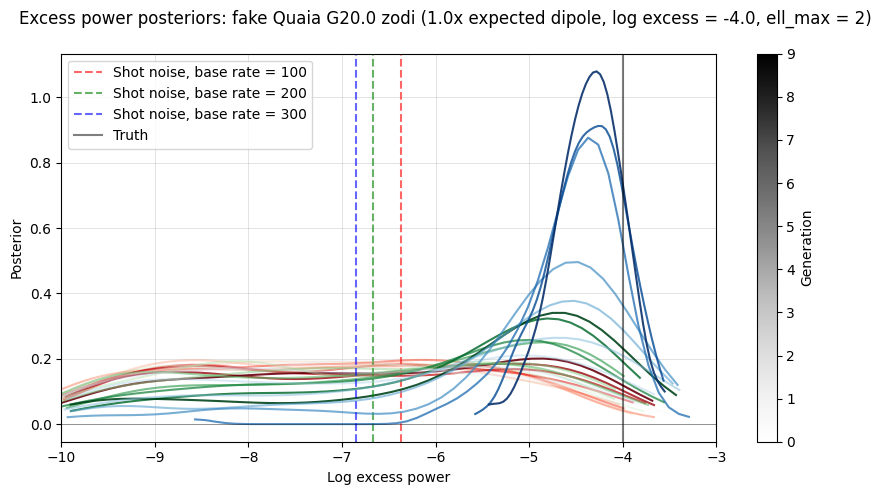

In [89]:
# evolution of the log excess posterior
cmaps = ['Reds', 'Greens', 'Blues']
cs = ['r', 'g', 'b']
norm = mpl.colors.Normalize(vmin=0, vmax=total_res[100]['history'].max_t)

fig, ax = plt.subplots(figsize=(9,5), tight_layout=True)

for j, (base_rate, res) in enumerate(total_res.items()):
    smap = mpl.cm.ScalarMappable(norm=norm, cmap=cmaps[j])
    for i in range(res['history'].max_t + 1):
        alpha = 0.2 + i / res['history'].max_t * 0.7
        pyabc.visualization.plot_kde_1d_highlevel(res['history'], "log_excess", t=i, ax=ax, color=smap.to_rgba(i),
                                                  alpha=alpha)
    ax.axvline(np.log10(res['SN']), c=cs[j], alpha=0.6, label=f'Shot noise, base rate = {base_rate:.0f}', ls='--')

smap = mpl.cm.ScalarMappable(norm=norm, cmap='Greys')
fig.colorbar(smap, ax=ax, label='Generation')
ax.grid(alpha=0.5, lw=0.5)
ax.set_xlabel('Log excess power')
ax.set_xlim(res['prior']['log_excess'].args[0], res['prior']['log_excess'].args[0] + res['prior']['log_excess'].args[1])
ax.axhline(0., c='k', alpha=0.5, lw=0.5)
ax.axvline(float(log_excess), c='k', alpha=0.5, label='Truth')
ax.legend(loc=2)
fig.suptitle('Excess power posteriors: ' +
          f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2)')

### new `SilkOptimalEpsilon` strategy

In [74]:
sample_name = 'quaia_G20.0_zodi'
rel_input_dipamp = 1.
log_excess = '-4.0'
base_rate = 200.
label = f'fake Quaia G20.0 zodi ({rel_input_dipamp:.1f}x expected dipole, log excess = {log_excess}, ell_max = 2)'
case_dir = os.path.join(resdir, f'ABC/fake_data',
                            f'{sample_name}_base-rate-{base_rate:.4f}_dipamp-{rel_input_dipamp:.1f}x_excess-{log_excess}_ellmax-2')

# load fake data info: get the data map and convert to overdensity
fake_data = np.load(os.path.join(case_dir, 'fake_data.npy'), allow_pickle=True).item()
qmap = fake_data['data']['data'].astype(float)
Nunmasked = np.sum(qmap != 0.)
qmap[qmap == 0.] = np.nan

# overdensity
odmap = qmap / np.nanmean(qmap) - 1

# back out the dipole 3-vector from the input amplitude and CMB dipole direction
input_kin_dipole_comps = dipole.cmb_dipole(amplitude=fake_data['input_dipole_amp'], return_comps=True)

# construct the kinematic dipole and excess power maps
input_kin_dipmap = dipole.dipole_map(np.append(0, input_kin_dipole_comps))
excess_map = hp.sphtfunc.alm2map(fake_data['alms'], 64)
total_map = input_kin_dipmap + excess_map

# dipole in the map: fit the dipole using healpy's least-squares fit function
#  we trust this to give us the true dipole since we're working on the full sky
fit_dipole_comps = hp.fit_dipole(total_map)[1]
print(f"best-fit dipole:\t{fit_dipole_comps}\tamplitude = {np.linalg.norm(fit_dipole_comps):.4f}")

# projection of the total dipole onto the CMB dipole direction
proj = (np.dot(input_kin_dipole_comps, fit_dipole_comps)/np.linalg.norm(input_kin_dipole_comps)**2)*input_kin_dipole_comps
true_dipamp_proj = np.linalg.norm(proj)
print(f"amplitude of the total dipole projected onto the expected dipole direction:\t{true_dipamp_proj:.5f}")

best-fit dipole:	[-0.00538689  0.00334685 -0.0020754 ]	amplitude = 0.0067
amplitude of the total dipole projected onto the expected dipole direction:	0.00618


In [75]:
# load the history
nmocks = 500
ell_max = 2
db_path = os.path.join(tempfile.gettempdir(), case_dir, f'dipole_excess_nside{nside}_{nmocks}mocks_10iters_ellmax-{ell_max}',
                                                                                  'SilkOptimalEpsilon_k-10', 'history.db')
history = pyabc.History("sqlite:///" + db_path)